1) load a data for a test
2) update a loop for test
3) for each epoch display a training loss , validation loss and test loss + ssim value also

# Data Loading

## Train

In [1]:
X_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy'
y_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy'

## Test

In [2]:
X_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-test-data/2024-06-10_0d6402b1/seismic_w_noise_vol_44319345.npy'
y_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487919/seismicCubes_RFC_fullstack_2024.42487919.npy'

## Valid

In [3]:
X_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismic_w_noise_vol_42502775.npy'
y_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismicCubes_RFC_fullstack_2024.42502775.npy'

In [4]:
shape = (1259,300,300)
# load the data
# make the data in 2d section
# make the train set and test set
# print the image also

In [5]:
import os
import pandas as pd
import numpy as np
from torchvision.io import read_image
from torch.utils.data import Dataset,DataLoader
import torch
# 2 files
# 1259*300*300 ---> 1259*300 in 300 images
# x,y load
# x,y sub sample
# pair
# return
class volDataset(Dataset):
    def __init__(self, x_slices, y_slices, transform=None):
        """
        x_slices: List of noisy seismic slices (each of shape 1259x300)
        y_slices: List of clean seismic slices (each of shape 1259x300)
        """
        self.x_slices = x_slices
        self.y_slices = y_slices
        self.transform = transform

    def __len__(self):
        return len(self.x_slices)

    def __getitem__(self, idx):
        """Returns one slice (1, 1259, 300)"""
        x_slice = torch.tensor(self.x_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)
        y_slice = torch.tensor(self.y_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)

        if self.transform:
            x_slice = self.transform(x_slice)
            y_slice = self.transform(y_slice)

        return x_slice, y_slice

In [6]:
from sklearn.model_selection import train_test_split
# Convert volume to 2D slices
# Load seismic volumes
X_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy',allow_pickle=True)  # (1259, 300, 300)
y_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy',allow_pickle=True)  # (1259, 300, 300)

X_volume_t = np.load(X_test_path,allow_pickle=True)
y_volume_t = np.load(y_test_path,allow_pickle=True)

X_volume_v = np.load(X_valid_path,allow_pickle=True)
y_volume_v = np.load(y_valid_path,allow_pickle=True)
# Convert volume to 2D slices

X_slices = [X_volume[:, :, i] for i in range(X_volume.shape[2])]  # List of 300 slices
y_slices = [y_volume[:, :, i] for i in range(y_volume.shape[2])]  # List of 300 slices

X_slices_t = [X_volume_t[:, :, i] for i in range(X_volume_t.shape[2])]
y_slices_t = [y_volume_t[:, :, i] for i in range(y_volume_t.shape[2])]

X_slices_v = [X_volume_v[:, :, i] for i in range(X_volume_v.shape[2])]
y_slices_v = [y_volume_v[:, :, i] for i in range(y_volume_v.shape[2])]

# Create datasets
train_dataset = volDataset(X_slices, y_slices)
valid_dataset = volDataset(X_slices_v,y_slices_v)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(valid_dataset,batch_size=8, shuffle=False)

# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break
for x_batch, y_batch in val_loader:
    print("valid Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])
valid Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


# Model

In [7]:
import os
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

In [8]:
class Crop2d(nn.Module):
    def __init__(self, left=10, right=10, top=21, bottom=0):
        super(Crop2d, self).__init__()
        self.left = left
        self.right = right
        self.top = top
        self.bottom = bottom

    def forward(self, x):
        return x[:, :, self.top:x.shape[2] - self.bottom, self.left:x.shape[3] - self.right]

In [9]:
class cnn_model(nn.Module):
    def __init__(self):
        super().__init__()


        self.cnn_model = nn.Sequential(
    nn.ZeroPad2d((10,10,21,0)),
    nn.Conv2d(in_channels=1, out_channels=256, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Dropout2d(p=0.3),  # Dropout added
    nn.MaxPool2d(2, stride=2),

    nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Dropout2d(p=0.3),  # Dropout added
    nn.MaxPool2d(2, stride=2),

    nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.Dropout2d(p=0.3),  # Dropout added
    nn.MaxPool2d(2, stride=2),

    nn.Conv2d(in_channels=64, out_channels=32, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Dropout2d(p=0.3),  # Dropout added
    nn.MaxPool2d(2, stride=2),

    nn.Upsample(scale_factor=2),
    nn.ConvTranspose2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.Dropout2d(p=0.3),  # Dropout added

    nn.Upsample(scale_factor=2),
    nn.ConvTranspose2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Dropout2d(p=0.3),  # Dropout added

    nn.Upsample(scale_factor=2),
    nn.ConvTranspose2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Dropout2d(p=0.3),  # Dropout added

    nn.Upsample(scale_factor=2),
    nn.ConvTranspose2d(in_channels=256, out_channels=1, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm2d(1),
    nn.ReLU(),
    Crop2d(10, 10, 21, 0),
)


    def forward(self,x):
        return self.cnn_model(x)
    
model = cnn_model()
x = torch.randn(1,1,1259,300)
output = model(x)

print(output.shape)
        

torch.Size([1, 1, 1259, 300])


In [10]:
pip install torcheval

Note: you may need to restart the kernel to use updated packages.


In [11]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define model
model = cnn_model()

# Define Loss Function (MSE for denoising)
criterion = nn.MSELoss()

# Define Optimizer (Adam works well)
optimizer = optim.Adam(model.parameters(), lr=0.1)

In [12]:
# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (batch_size, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


In [13]:
from torchmetrics import StructuralSimilarityIndexMeasure
ssim_metric = StructuralSimilarityIndexMeasure()

/home/simlab120/anaconda3/envs/torch/lib/python3.12/site-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `StructuralSimilarityIndexMeasure` from `torchmetrics` was deprecated and will be removed in 2.0. Import `StructuralSimilarityIndexMeasure` from `torchmetrics.image` instead.
  _future_warning(


In [14]:
import matplotlib.pyplot as plt

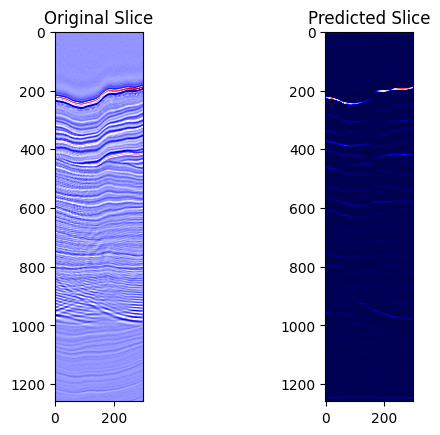

Epoch [1/200], Train Loss: 9900.7428, Train SSIM: 0.4760,           Val Loss: 9486.8056, Val SSIM: 0.4142


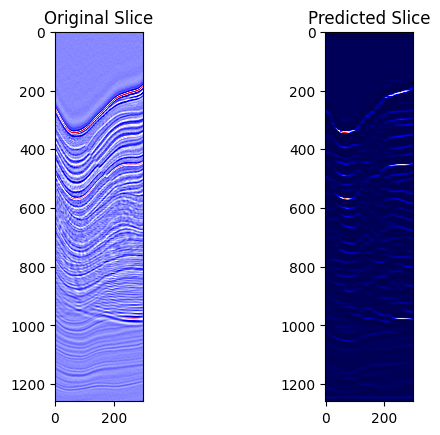

Epoch [2/200], Train Loss: 9353.8440, Train SSIM: 0.4800,           Val Loss: 8368.7307, Val SSIM: 0.4210


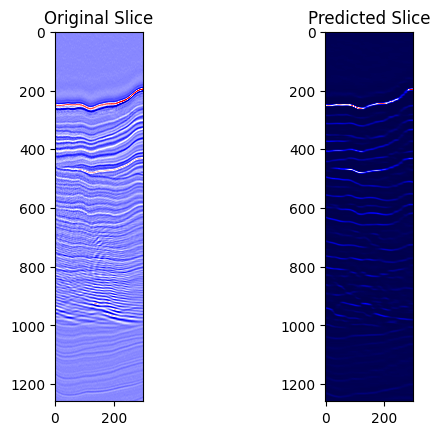

Epoch [3/200], Train Loss: 8831.1644, Train SSIM: 0.4836,           Val Loss: 8142.7460, Val SSIM: 0.4337


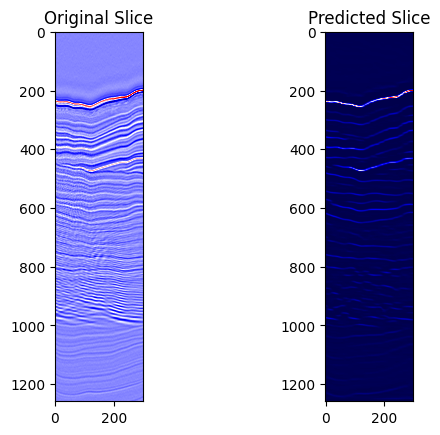

Epoch [4/200], Train Loss: 8391.9441, Train SSIM: 0.4879,           Val Loss: 7572.3775, Val SSIM: 0.4410


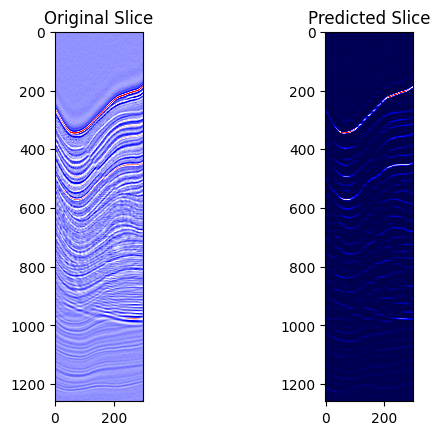

Epoch [5/200], Train Loss: 7988.1249, Train SSIM: 0.4937,           Val Loss: 7629.1556, Val SSIM: 0.4525


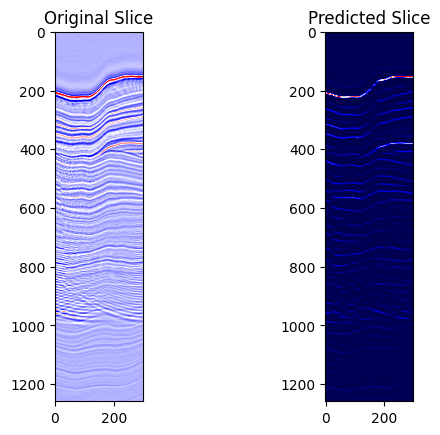

Epoch [6/200], Train Loss: 7653.7781, Train SSIM: 0.4976,           Val Loss: 7296.2078, Val SSIM: 0.4462


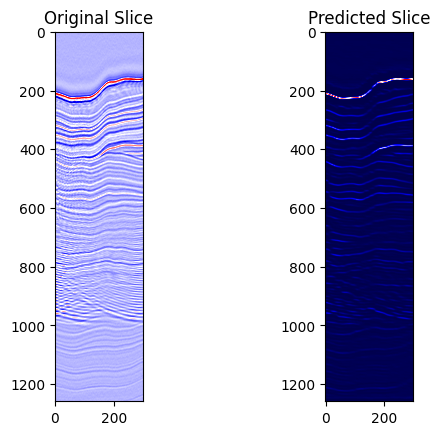

Epoch [7/200], Train Loss: 7314.3580, Train SSIM: 0.5007,           Val Loss: 7237.9375, Val SSIM: 0.4493


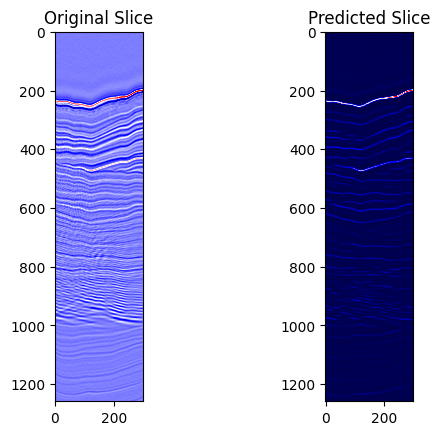

Epoch [8/200], Train Loss: 6997.3254, Train SSIM: 0.5060,           Val Loss: 6868.4375, Val SSIM: 0.4396


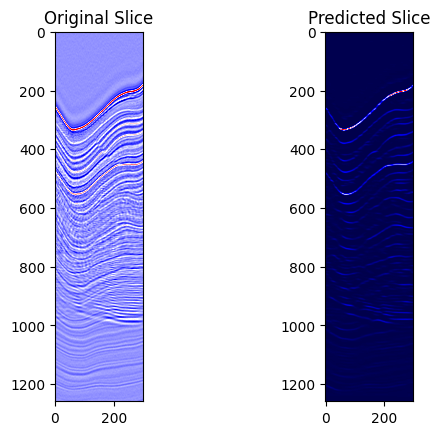

Epoch [9/200], Train Loss: 6756.4587, Train SSIM: 0.5096,           Val Loss: 6891.7169, Val SSIM: 0.4739


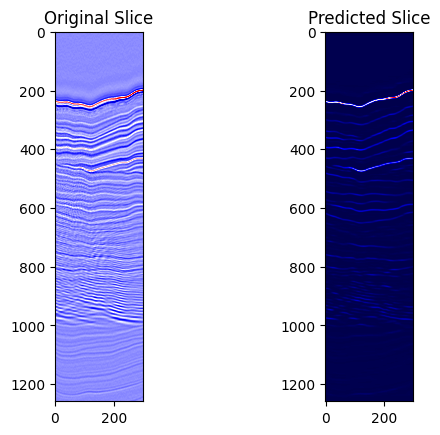

Epoch [10/200], Train Loss: 6516.0013, Train SSIM: 0.5146,           Val Loss: 6777.4048, Val SSIM: 0.4684


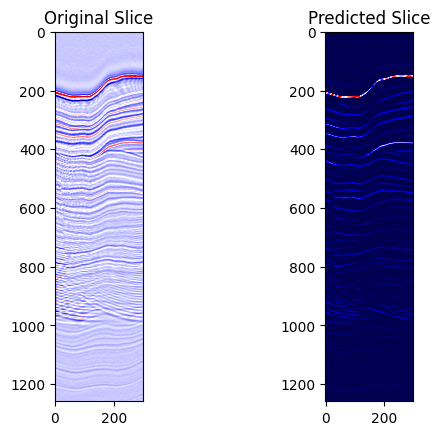

Epoch [11/200], Train Loss: 6372.9980, Train SSIM: 0.5190,           Val Loss: 6215.0526, Val SSIM: 0.4788


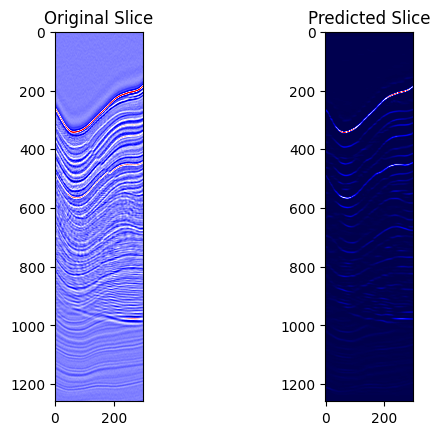

Epoch [12/200], Train Loss: 6215.4515, Train SSIM: 0.5206,           Val Loss: 6186.8783, Val SSIM: 0.4807


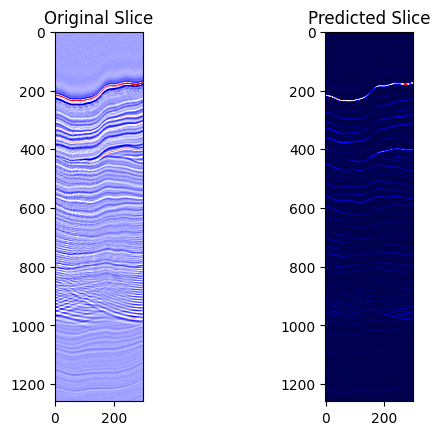

Epoch [13/200], Train Loss: 6049.9155, Train SSIM: 0.5262,           Val Loss: 6244.1874, Val SSIM: 0.4820


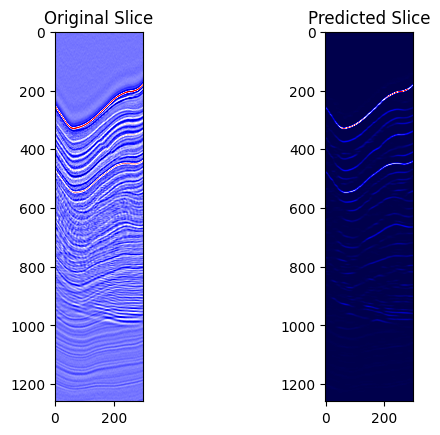

Epoch [14/200], Train Loss: 5958.7086, Train SSIM: 0.5282,           Val Loss: 6164.3593, Val SSIM: 0.4979


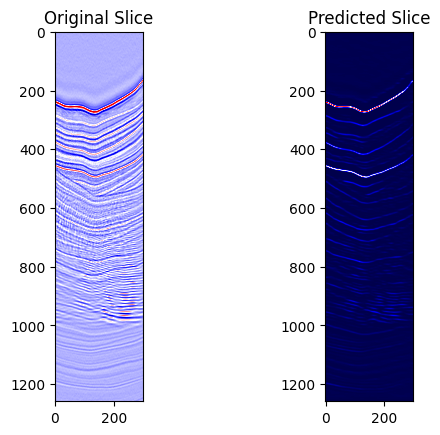

Epoch [15/200], Train Loss: 5892.7359, Train SSIM: 0.5301,           Val Loss: 6286.5304, Val SSIM: 0.4807


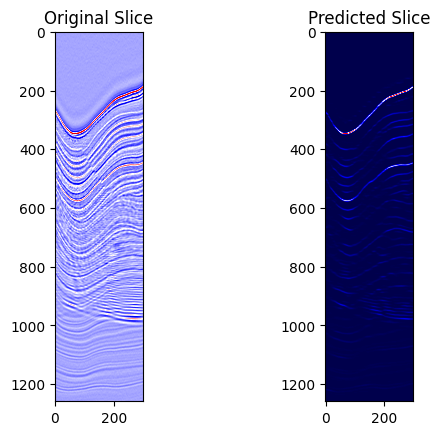

Epoch [16/200], Train Loss: 5783.4496, Train SSIM: 0.5338,           Val Loss: 5932.0737, Val SSIM: 0.5012


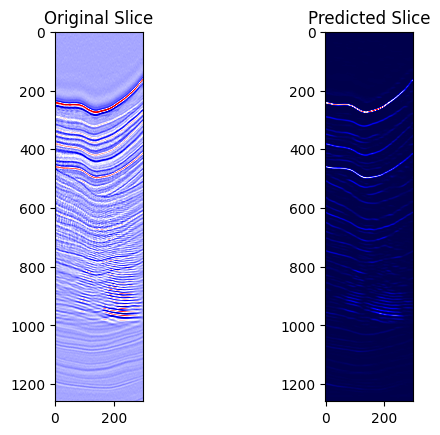

Epoch [17/200], Train Loss: 5712.6783, Train SSIM: 0.5347,           Val Loss: 5997.0921, Val SSIM: 0.5000


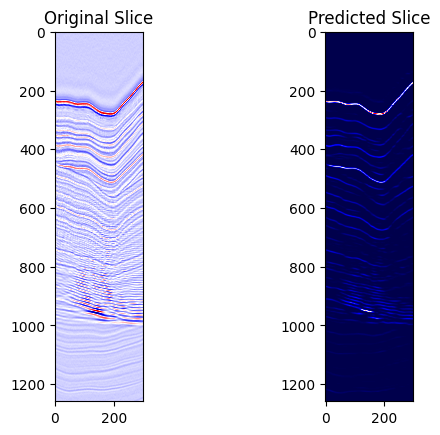

Epoch [18/200], Train Loss: 5680.1369, Train SSIM: 0.5359,           Val Loss: 5909.2515, Val SSIM: 0.5079


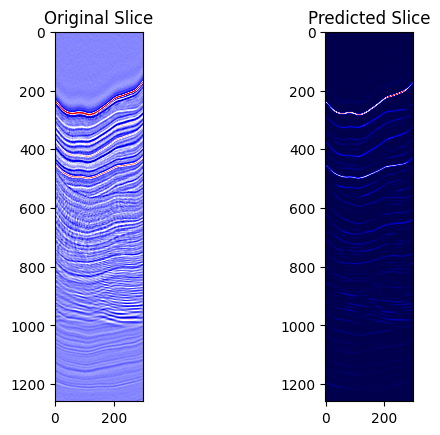

Epoch [19/200], Train Loss: 5648.0071, Train SSIM: 0.5379,           Val Loss: 5850.4815, Val SSIM: 0.5061


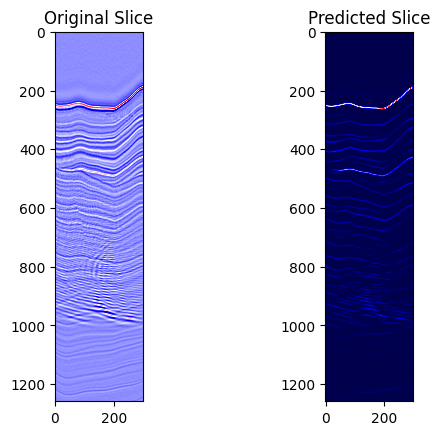

Epoch [20/200], Train Loss: 5566.6824, Train SSIM: 0.5381,           Val Loss: 5866.4420, Val SSIM: 0.5099


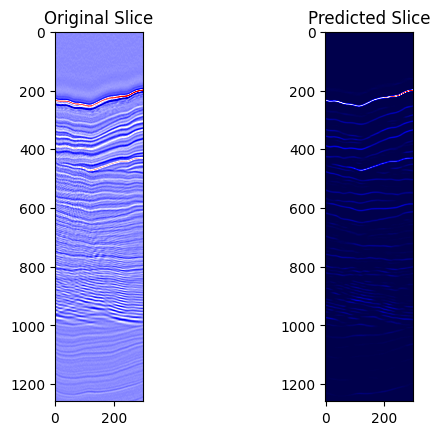

Epoch [21/200], Train Loss: 5531.9160, Train SSIM: 0.5400,           Val Loss: 5883.7517, Val SSIM: 0.5141


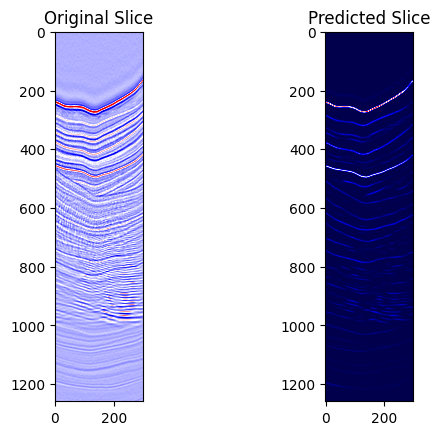

Epoch [22/200], Train Loss: 5552.4522, Train SSIM: 0.5412,           Val Loss: 5772.9154, Val SSIM: 0.5108


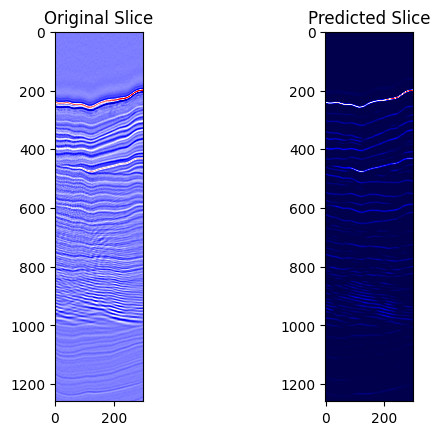

Epoch [23/200], Train Loss: 5497.0264, Train SSIM: 0.5401,           Val Loss: 5765.6137, Val SSIM: 0.5188


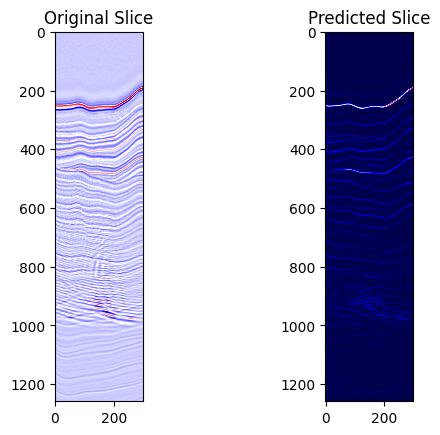

Epoch [24/200], Train Loss: 5468.1279, Train SSIM: 0.5420,           Val Loss: 5702.3112, Val SSIM: 0.5061


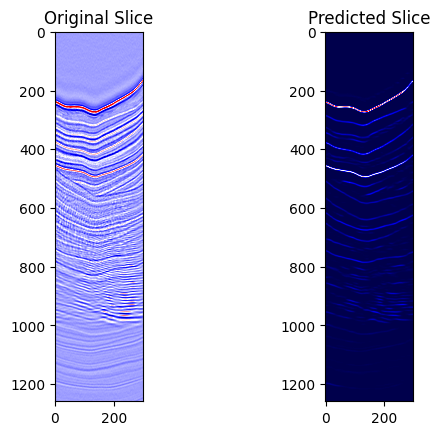

Epoch [25/200], Train Loss: 5445.6462, Train SSIM: 0.5427,           Val Loss: 5765.9914, Val SSIM: 0.5144


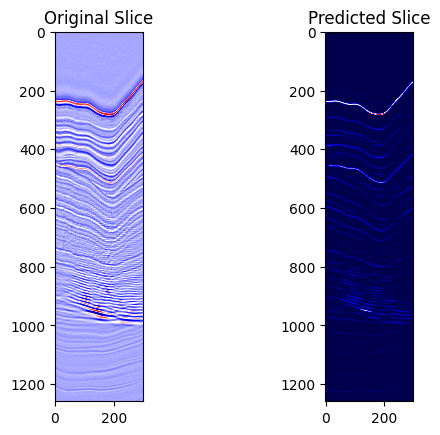

Epoch [26/200], Train Loss: 5391.5707, Train SSIM: 0.5447,           Val Loss: 5698.7414, Val SSIM: 0.5159


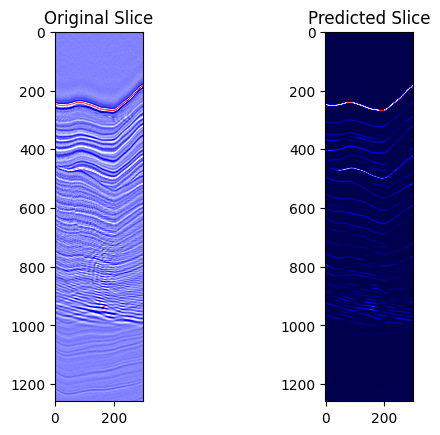

Epoch [27/200], Train Loss: 5401.2066, Train SSIM: 0.5438,           Val Loss: 5709.5700, Val SSIM: 0.5134


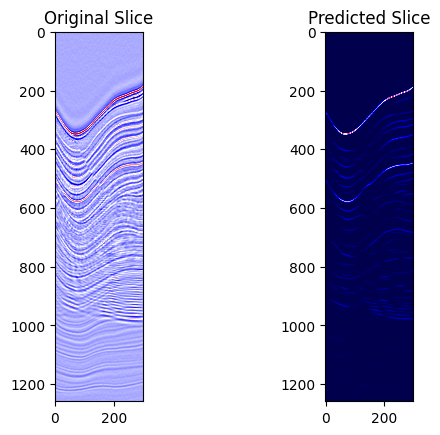

Epoch [28/200], Train Loss: 5380.1058, Train SSIM: 0.5466,           Val Loss: 5811.9142, Val SSIM: 0.5048


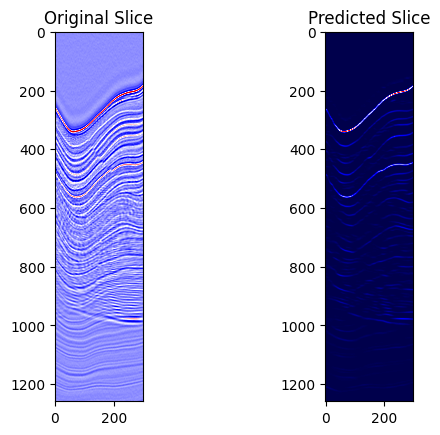

Epoch [29/200], Train Loss: 5384.5656, Train SSIM: 0.5444,           Val Loss: 5640.5826, Val SSIM: 0.5198


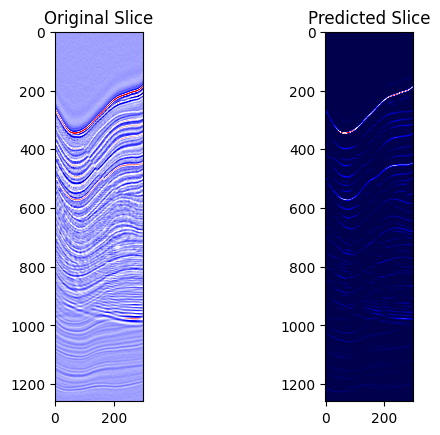

Epoch [30/200], Train Loss: 5337.3054, Train SSIM: 0.5456,           Val Loss: 5722.8559, Val SSIM: 0.5204


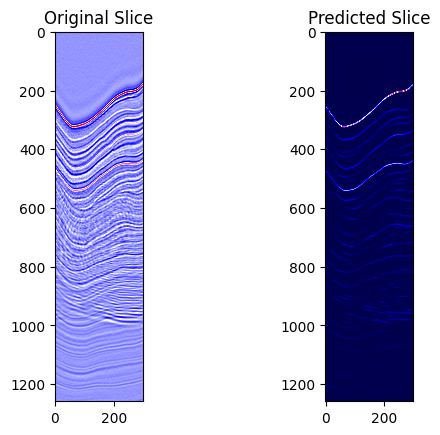

Epoch [31/200], Train Loss: 5346.0381, Train SSIM: 0.5463,           Val Loss: 5661.2349, Val SSIM: 0.5142


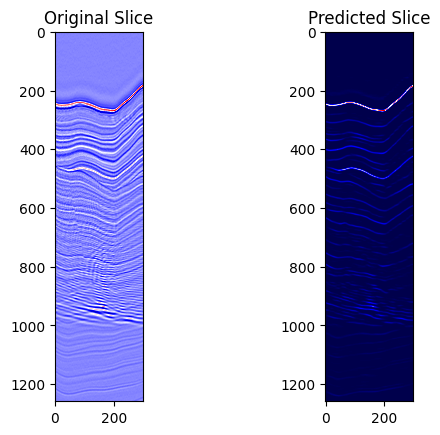

Epoch [32/200], Train Loss: 5325.1261, Train SSIM: 0.5467,           Val Loss: 5694.1415, Val SSIM: 0.5184


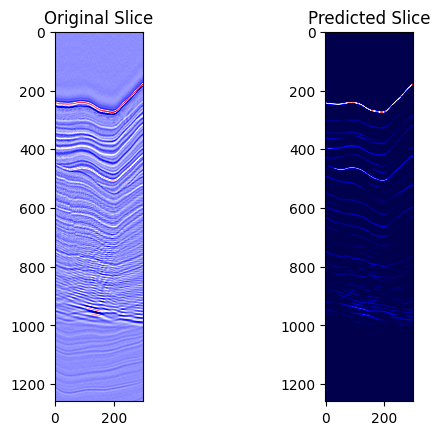

Epoch [33/200], Train Loss: 5327.7613, Train SSIM: 0.5452,           Val Loss: 5682.0804, Val SSIM: 0.5023


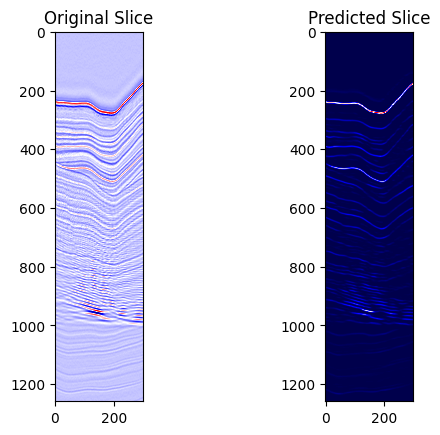

Epoch [34/200], Train Loss: 5311.2194, Train SSIM: 0.5488,           Val Loss: 5641.1078, Val SSIM: 0.5220


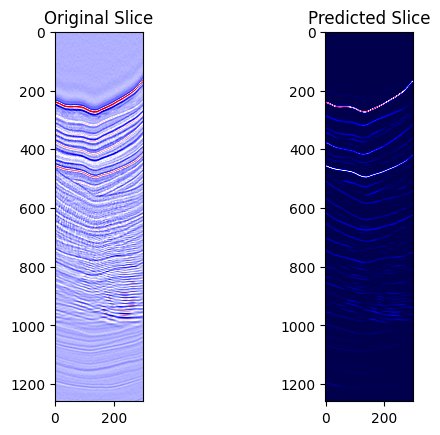

Epoch [35/200], Train Loss: 5280.7052, Train SSIM: 0.5497,           Val Loss: 5663.1690, Val SSIM: 0.5197


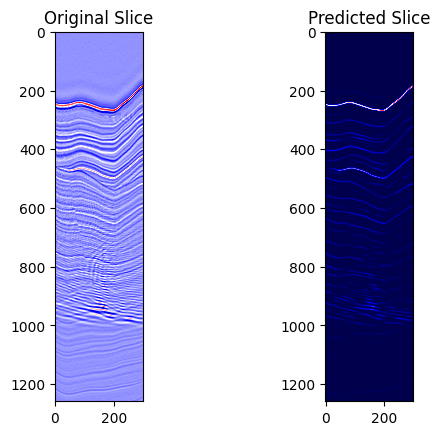

Epoch [36/200], Train Loss: 5277.7181, Train SSIM: 0.5491,           Val Loss: 5660.9330, Val SSIM: 0.5197


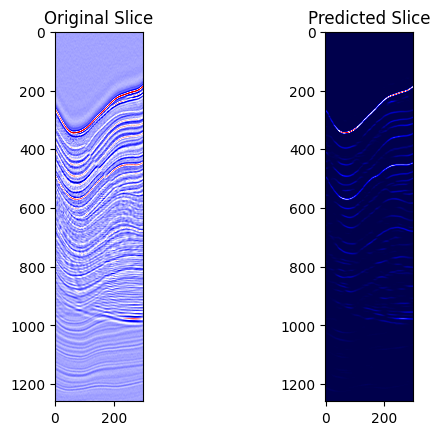

Epoch [37/200], Train Loss: 5293.5322, Train SSIM: 0.5491,           Val Loss: 5674.2261, Val SSIM: 0.5102


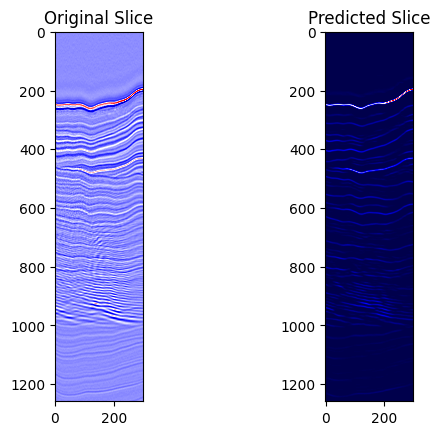

Epoch [38/200], Train Loss: 5281.5568, Train SSIM: 0.5489,           Val Loss: 5586.9049, Val SSIM: 0.5236


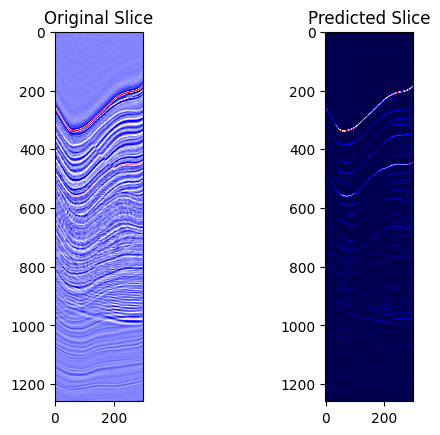

Epoch [39/200], Train Loss: 5277.7710, Train SSIM: 0.5498,           Val Loss: 5647.3794, Val SSIM: 0.5249


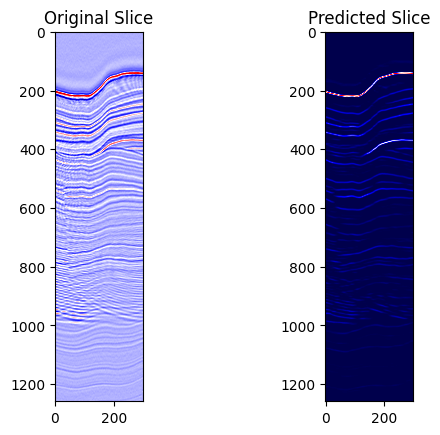

Epoch [40/200], Train Loss: 5272.4033, Train SSIM: 0.5506,           Val Loss: 5623.7309, Val SSIM: 0.5212


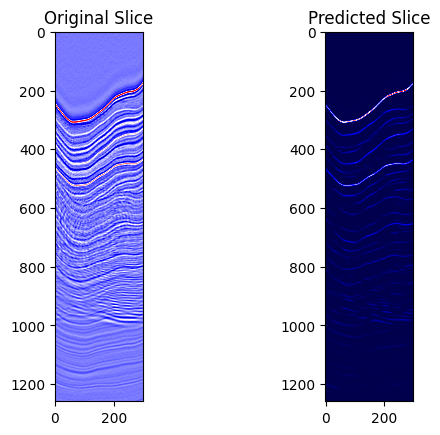

Epoch [41/200], Train Loss: 5265.3538, Train SSIM: 0.5514,           Val Loss: 5616.4414, Val SSIM: 0.5179


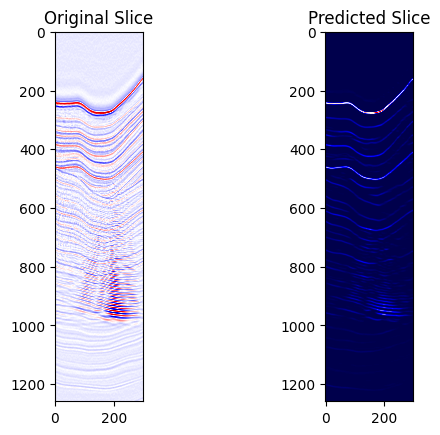

Epoch [42/200], Train Loss: 5260.6387, Train SSIM: 0.5492,           Val Loss: 5601.3480, Val SSIM: 0.5170


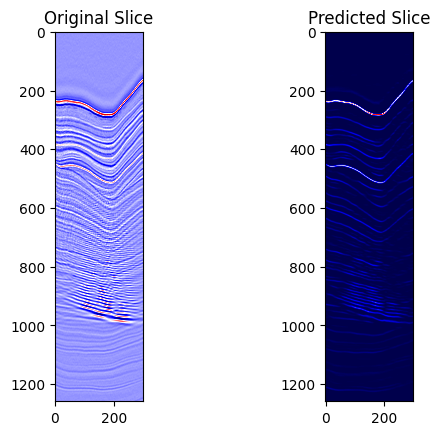

Epoch [43/200], Train Loss: 5247.1938, Train SSIM: 0.5512,           Val Loss: 5558.2710, Val SSIM: 0.5260


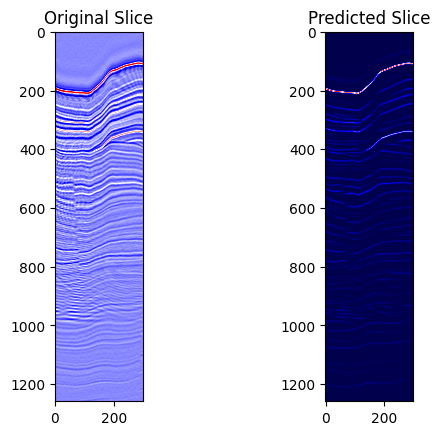

Epoch [44/200], Train Loss: 5240.5376, Train SSIM: 0.5501,           Val Loss: 5634.2370, Val SSIM: 0.5212


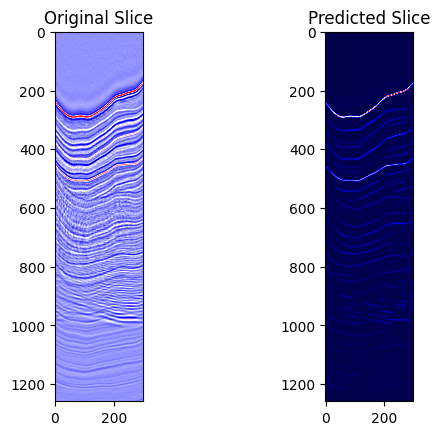

Epoch [45/200], Train Loss: 5256.3557, Train SSIM: 0.5501,           Val Loss: 5596.0921, Val SSIM: 0.5204


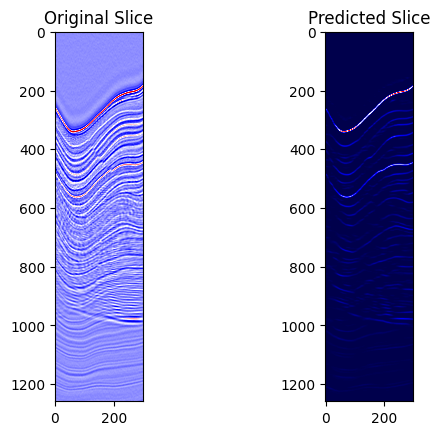

Epoch [46/200], Train Loss: 5221.3977, Train SSIM: 0.5511,           Val Loss: 5617.3919, Val SSIM: 0.5204


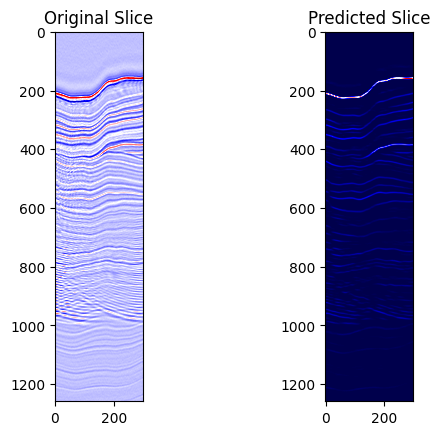

Epoch [47/200], Train Loss: 5207.6399, Train SSIM: 0.5521,           Val Loss: 5632.5754, Val SSIM: 0.5242


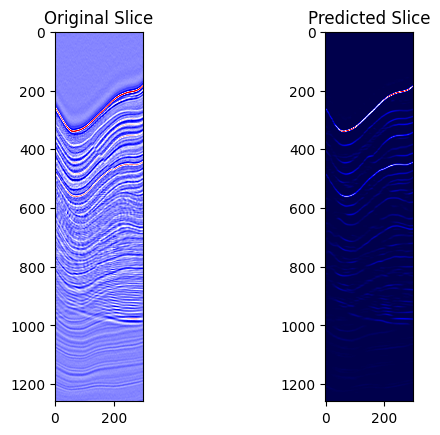

Epoch [48/200], Train Loss: 5219.2445, Train SSIM: 0.5516,           Val Loss: 5609.1202, Val SSIM: 0.5159


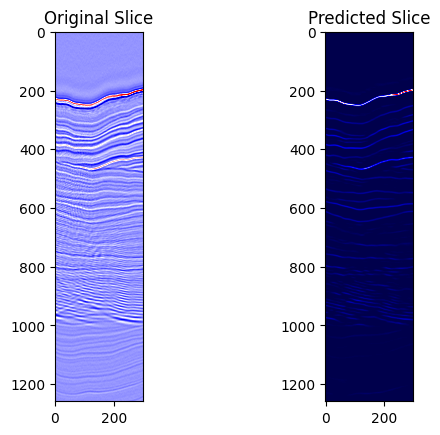

Epoch [49/200], Train Loss: 5212.9882, Train SSIM: 0.5530,           Val Loss: 5579.7029, Val SSIM: 0.5201


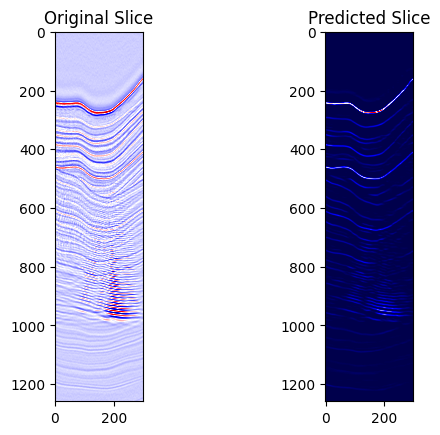

Epoch [50/200], Train Loss: 5199.9034, Train SSIM: 0.5518,           Val Loss: 5582.5458, Val SSIM: 0.5228


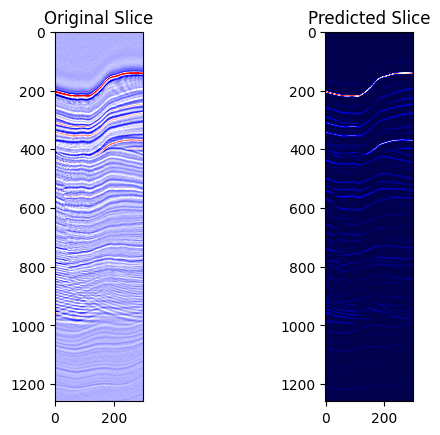

Epoch [51/200], Train Loss: 5187.3626, Train SSIM: 0.5538,           Val Loss: 5560.5068, Val SSIM: 0.5256


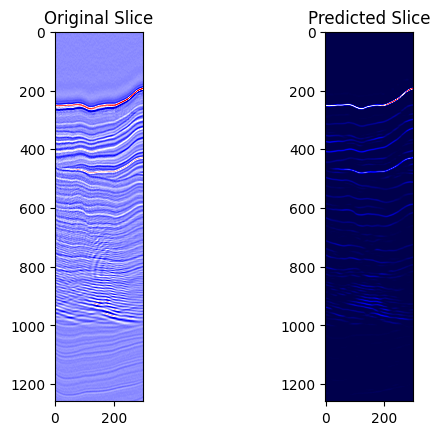

Epoch [52/200], Train Loss: 5173.9585, Train SSIM: 0.5516,           Val Loss: 5655.0907, Val SSIM: 0.5062


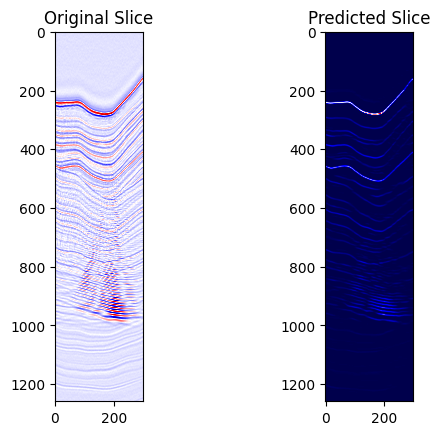

Epoch [53/200], Train Loss: 5173.4153, Train SSIM: 0.5535,           Val Loss: 5614.6534, Val SSIM: 0.5157


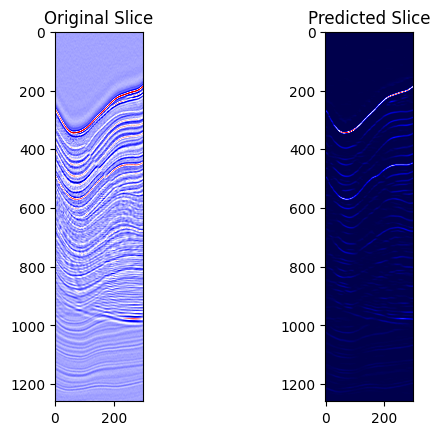

Epoch [54/200], Train Loss: 5202.9496, Train SSIM: 0.5531,           Val Loss: 5606.4683, Val SSIM: 0.5265


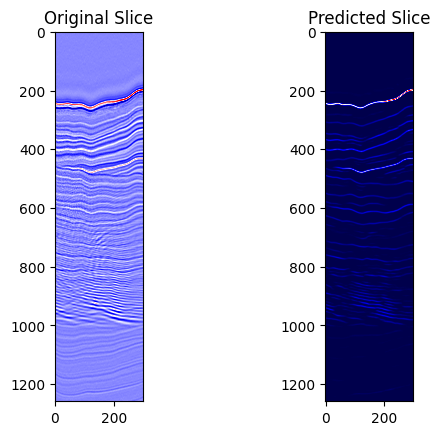

Epoch [55/200], Train Loss: 5187.0615, Train SSIM: 0.5537,           Val Loss: 5620.6370, Val SSIM: 0.5185


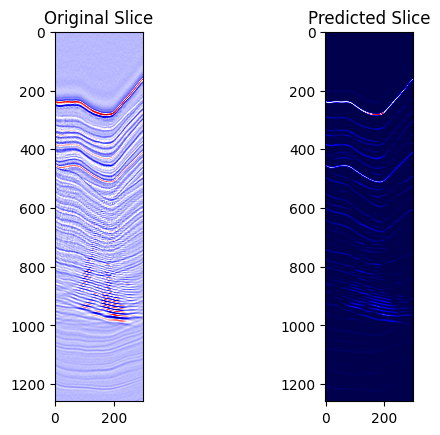

Epoch [56/200], Train Loss: 5149.7999, Train SSIM: 0.5560,           Val Loss: 5565.4979, Val SSIM: 0.5220


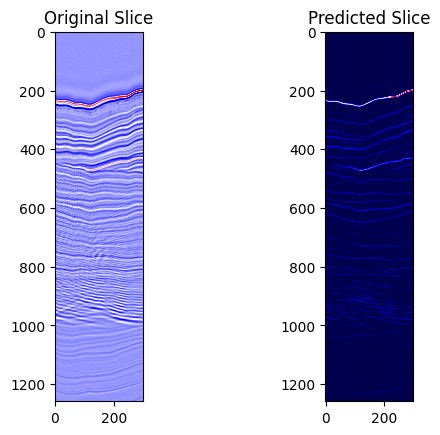

Epoch [57/200], Train Loss: 5199.4666, Train SSIM: 0.5538,           Val Loss: 5603.0272, Val SSIM: 0.5209


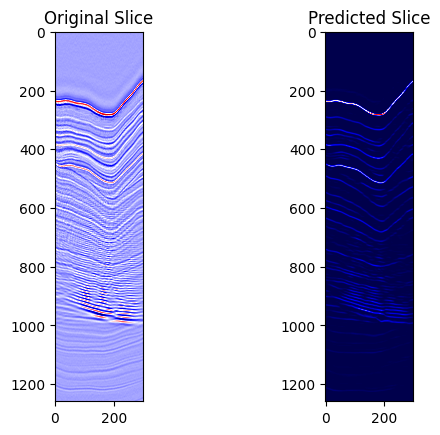

Epoch [58/200], Train Loss: 5144.4873, Train SSIM: 0.5549,           Val Loss: 5582.9795, Val SSIM: 0.5240


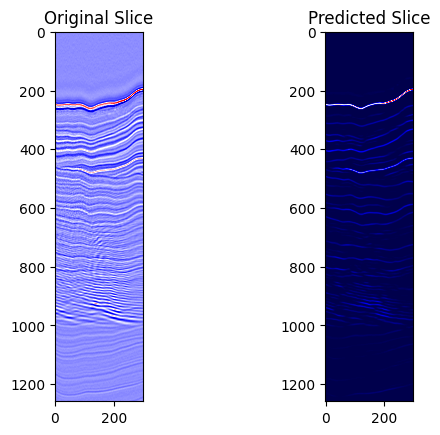

Epoch [59/200], Train Loss: 5164.1890, Train SSIM: 0.5533,           Val Loss: 5661.3010, Val SSIM: 0.5157


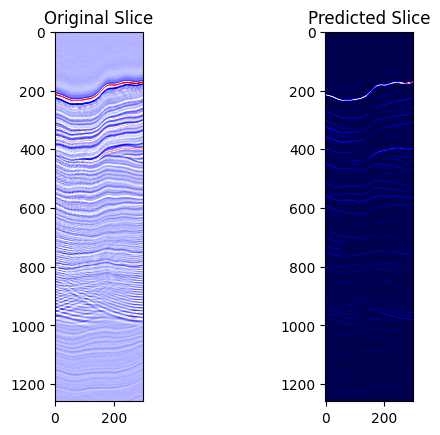

Epoch [60/200], Train Loss: 5179.6567, Train SSIM: 0.5545,           Val Loss: 5648.8995, Val SSIM: 0.5273


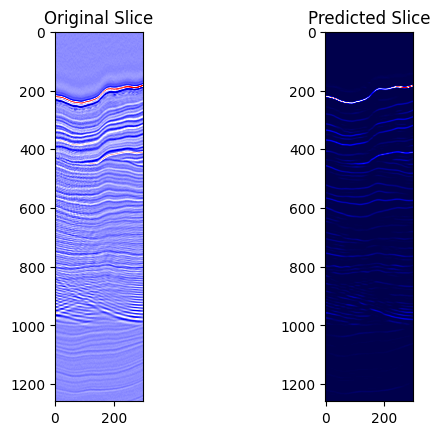

Epoch [61/200], Train Loss: 5177.1180, Train SSIM: 0.5541,           Val Loss: 5572.2002, Val SSIM: 0.5234


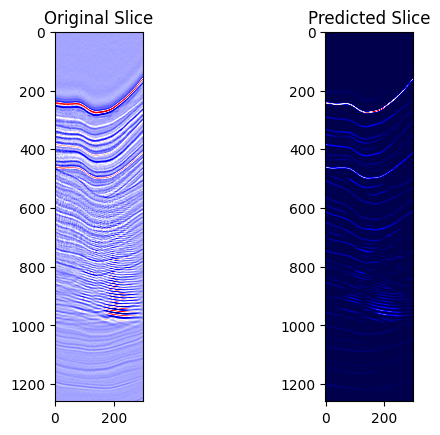

Epoch [62/200], Train Loss: 5120.3276, Train SSIM: 0.5552,           Val Loss: 5524.4373, Val SSIM: 0.5309


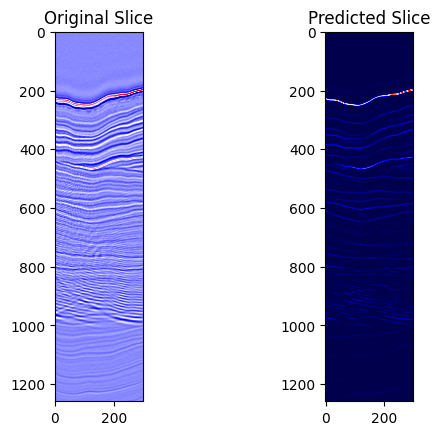

Epoch [63/200], Train Loss: 5164.6970, Train SSIM: 0.5548,           Val Loss: 5569.2836, Val SSIM: 0.5221


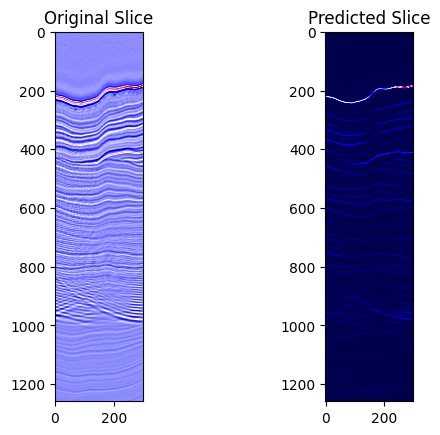

Epoch [64/200], Train Loss: 5166.2364, Train SSIM: 0.5536,           Val Loss: 5550.8559, Val SSIM: 0.5271


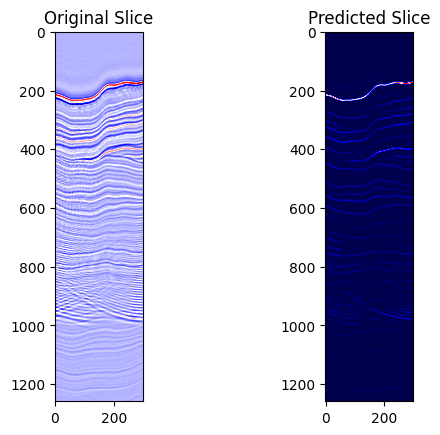

Epoch [65/200], Train Loss: 5137.2470, Train SSIM: 0.5552,           Val Loss: 5567.4929, Val SSIM: 0.5201


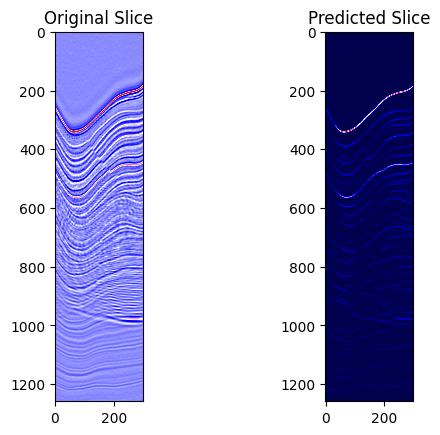

Epoch [66/200], Train Loss: 5148.7010, Train SSIM: 0.5552,           Val Loss: 5596.0900, Val SSIM: 0.5293


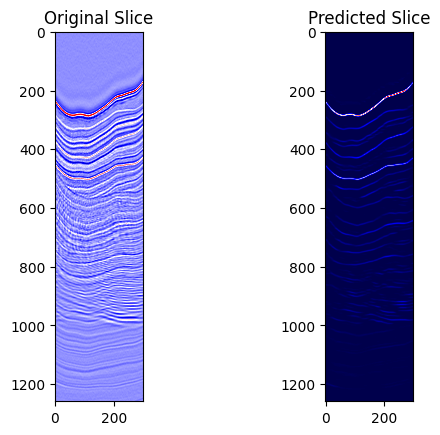

Epoch [67/200], Train Loss: 5133.5188, Train SSIM: 0.5548,           Val Loss: 5585.2512, Val SSIM: 0.5191


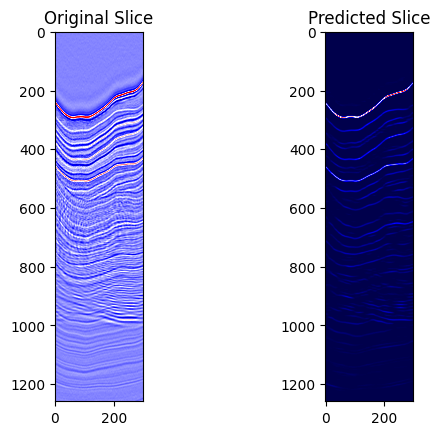

Epoch [68/200], Train Loss: 5101.3427, Train SSIM: 0.5556,           Val Loss: 5558.7043, Val SSIM: 0.5235


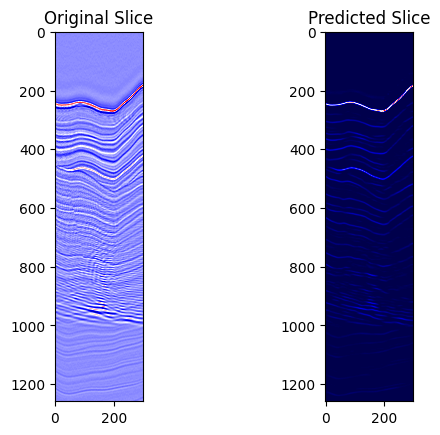

Epoch [69/200], Train Loss: 5101.6223, Train SSIM: 0.5548,           Val Loss: 5605.8468, Val SSIM: 0.5239


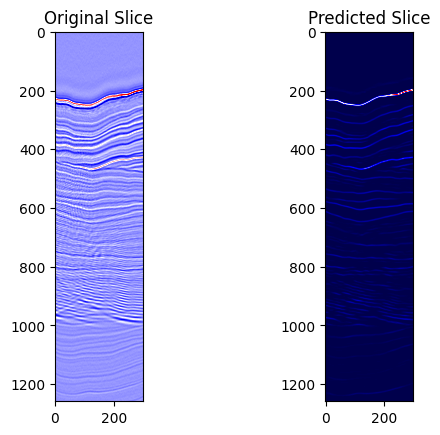

Epoch [70/200], Train Loss: 5115.3078, Train SSIM: 0.5565,           Val Loss: 5573.6917, Val SSIM: 0.5235


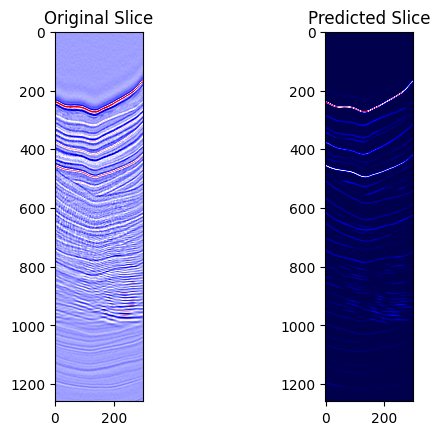

Epoch [71/200], Train Loss: 5136.3394, Train SSIM: 0.5561,           Val Loss: 5526.3855, Val SSIM: 0.5236


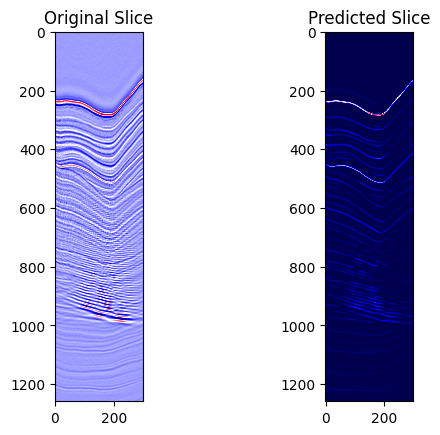

Epoch [72/200], Train Loss: 5123.3044, Train SSIM: 0.5549,           Val Loss: 5595.7780, Val SSIM: 0.5285


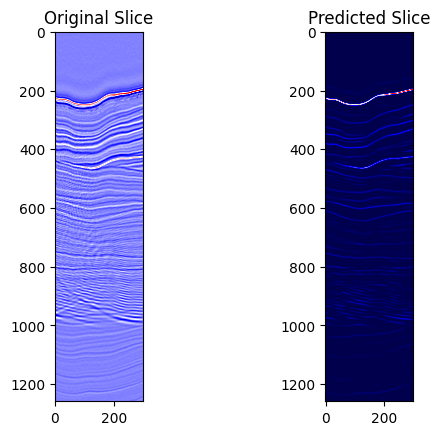

Epoch [73/200], Train Loss: 5128.0087, Train SSIM: 0.5557,           Val Loss: 5582.0412, Val SSIM: 0.5228


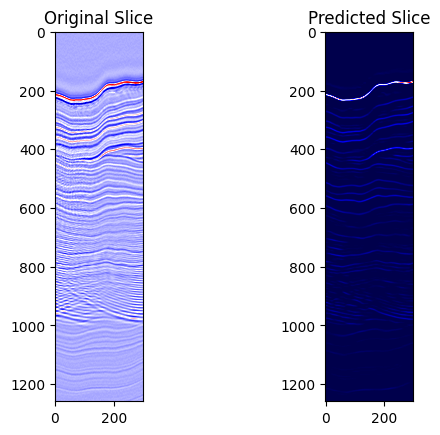

Epoch [74/200], Train Loss: 5134.2122, Train SSIM: 0.5553,           Val Loss: 5570.3389, Val SSIM: 0.5244


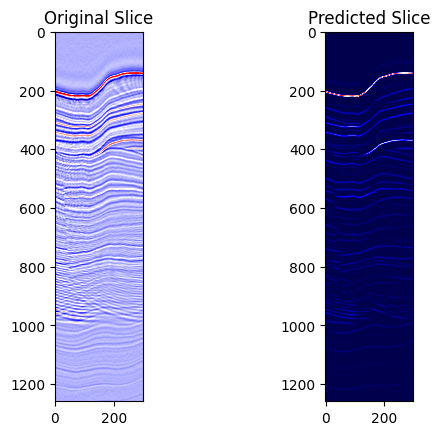

Epoch [75/200], Train Loss: 5120.6123, Train SSIM: 0.5559,           Val Loss: 5576.6944, Val SSIM: 0.5273


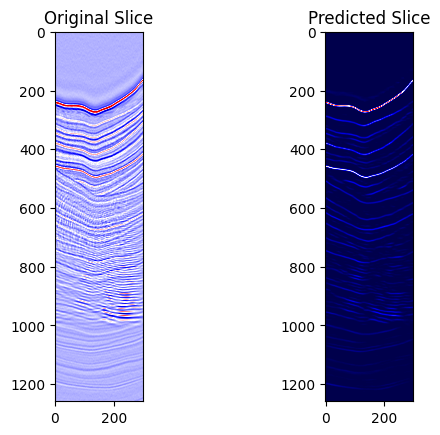

Epoch [76/200], Train Loss: 5106.0698, Train SSIM: 0.5555,           Val Loss: 5519.2794, Val SSIM: 0.5301


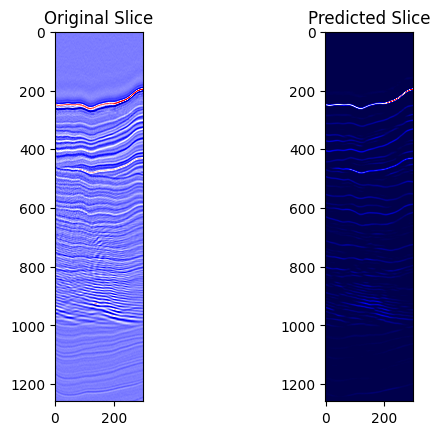

Epoch [77/200], Train Loss: 5126.2914, Train SSIM: 0.5557,           Val Loss: 5570.3331, Val SSIM: 0.5214


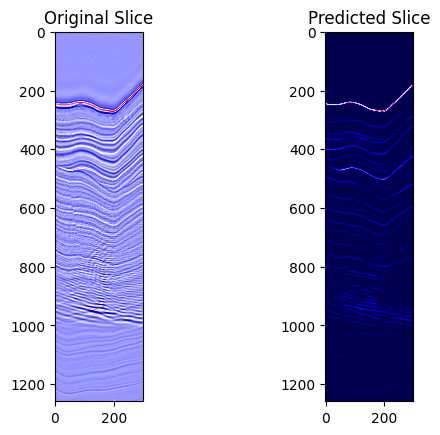

Epoch [78/200], Train Loss: 5101.3455, Train SSIM: 0.5575,           Val Loss: 5586.1272, Val SSIM: 0.5254


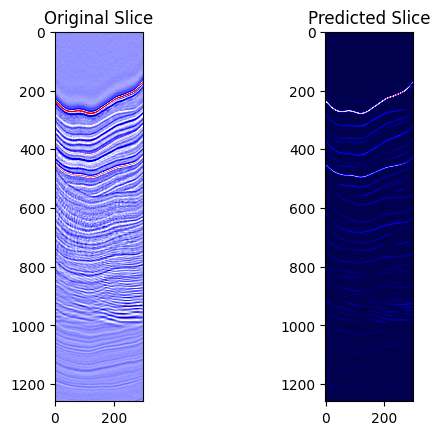

Epoch [79/200], Train Loss: 5099.4736, Train SSIM: 0.5561,           Val Loss: 5562.3342, Val SSIM: 0.5272


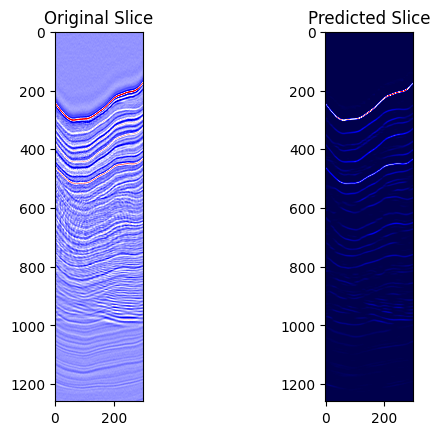

Epoch [80/200], Train Loss: 5105.4964, Train SSIM: 0.5572,           Val Loss: 5593.8930, Val SSIM: 0.5199


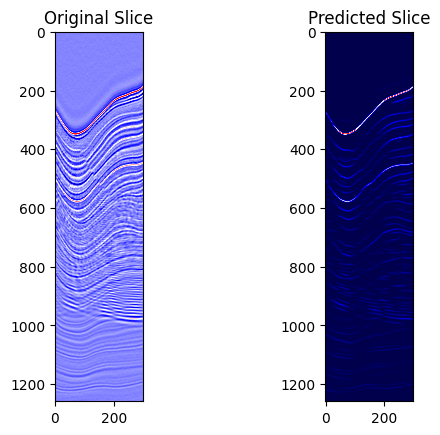

Epoch [81/200], Train Loss: 5119.3362, Train SSIM: 0.5559,           Val Loss: 5524.9508, Val SSIM: 0.5288


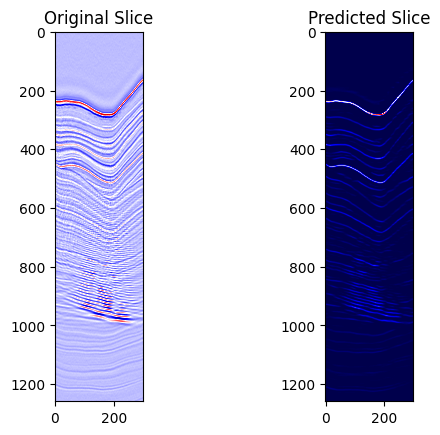

Epoch [82/200], Train Loss: 5103.6215, Train SSIM: 0.5563,           Val Loss: 5603.1590, Val SSIM: 0.5294


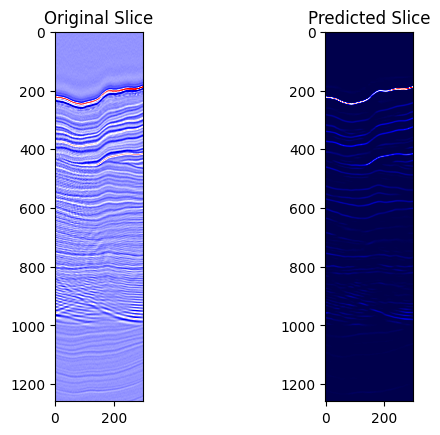

Epoch [83/200], Train Loss: 5102.6733, Train SSIM: 0.5566,           Val Loss: 5598.9444, Val SSIM: 0.5153


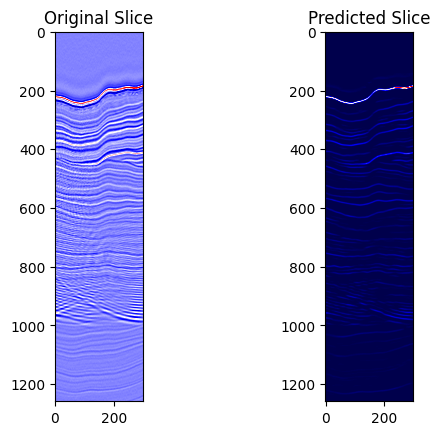

Epoch [84/200], Train Loss: 5090.0560, Train SSIM: 0.5576,           Val Loss: 5536.5610, Val SSIM: 0.5267


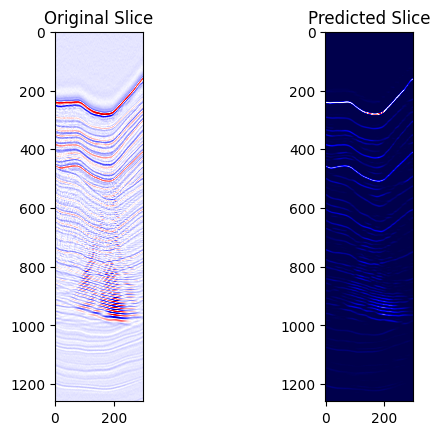

Epoch [85/200], Train Loss: 5102.8096, Train SSIM: 0.5553,           Val Loss: 5608.5928, Val SSIM: 0.5253


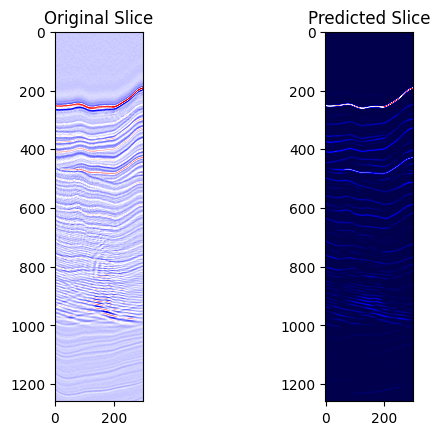

Epoch [86/200], Train Loss: 5105.1056, Train SSIM: 0.5568,           Val Loss: 5540.8582, Val SSIM: 0.5223


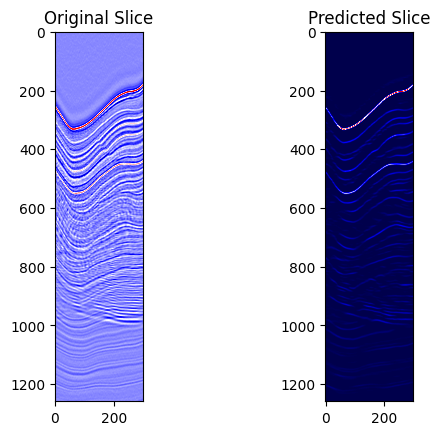

Epoch [87/200], Train Loss: 5093.6743, Train SSIM: 0.5568,           Val Loss: 5526.5192, Val SSIM: 0.5262


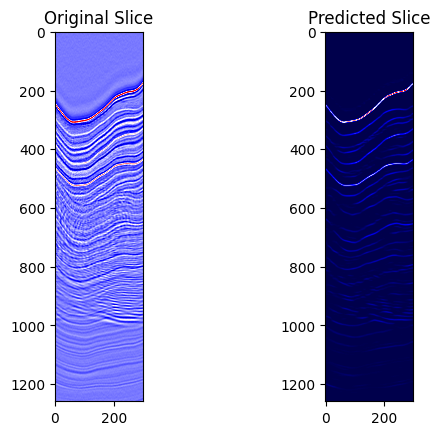

Epoch [88/200], Train Loss: 5069.7932, Train SSIM: 0.5576,           Val Loss: 5615.3259, Val SSIM: 0.5236


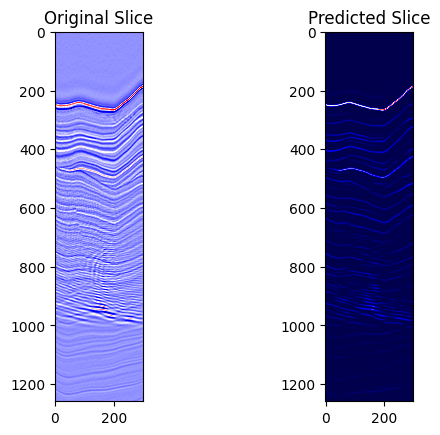

Epoch [89/200], Train Loss: 5100.8642, Train SSIM: 0.5570,           Val Loss: 5552.3450, Val SSIM: 0.5220


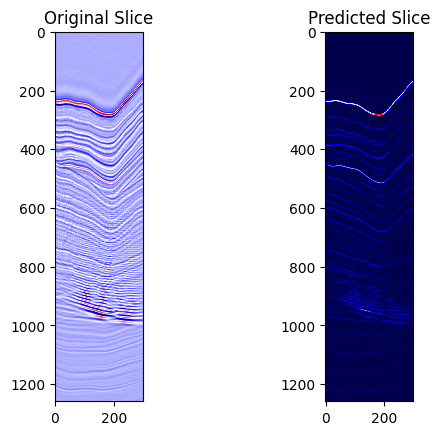

Epoch [90/200], Train Loss: 5080.2625, Train SSIM: 0.5586,           Val Loss: 5496.6375, Val SSIM: 0.5310


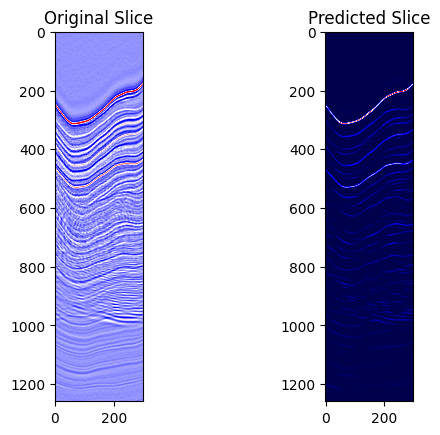

Epoch [91/200], Train Loss: 5066.1496, Train SSIM: 0.5581,           Val Loss: 5506.4612, Val SSIM: 0.5272


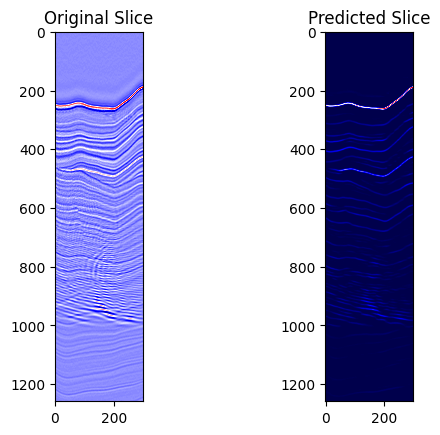

Epoch [92/200], Train Loss: 5048.0558, Train SSIM: 0.5606,           Val Loss: 5619.7793, Val SSIM: 0.5158


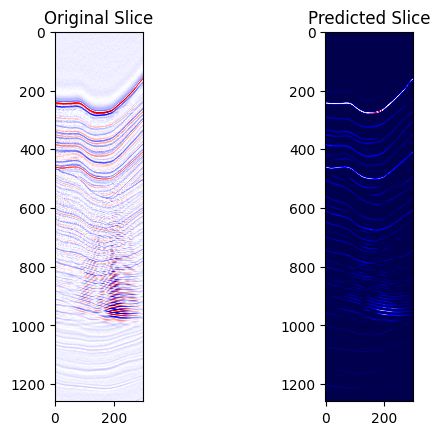

Epoch [93/200], Train Loss: 5064.6314, Train SSIM: 0.5598,           Val Loss: 5554.5645, Val SSIM: 0.5280


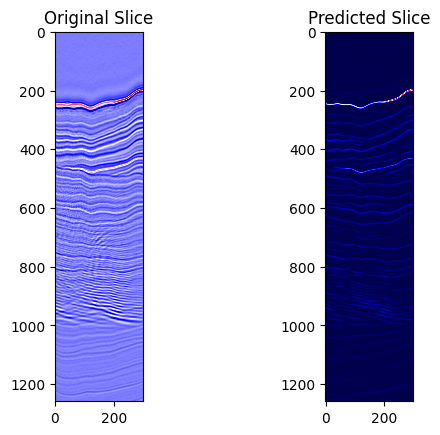

Epoch [94/200], Train Loss: 5060.5444, Train SSIM: 0.5587,           Val Loss: 5516.9654, Val SSIM: 0.5302


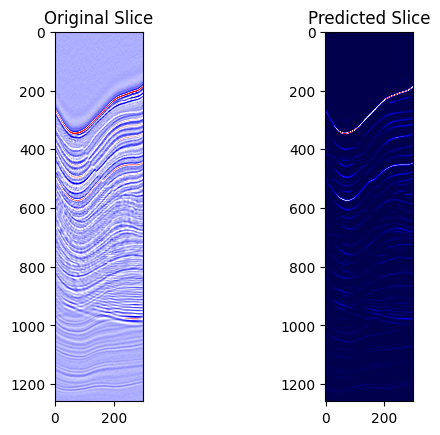

Epoch [95/200], Train Loss: 5075.6428, Train SSIM: 0.5585,           Val Loss: 5504.1838, Val SSIM: 0.5299


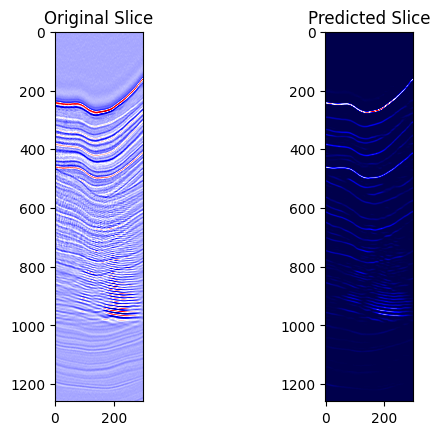

Epoch [96/200], Train Loss: 5070.5401, Train SSIM: 0.5586,           Val Loss: 5605.1645, Val SSIM: 0.5229


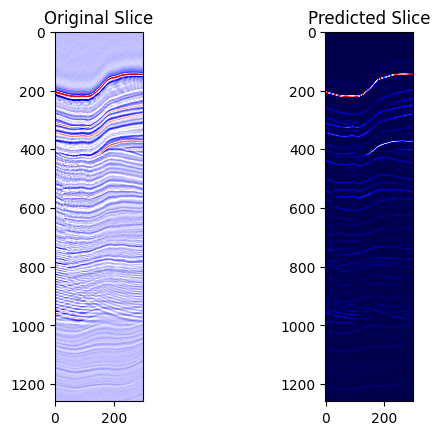

Epoch [97/200], Train Loss: 5031.4468, Train SSIM: 0.5604,           Val Loss: 5600.3086, Val SSIM: 0.5263


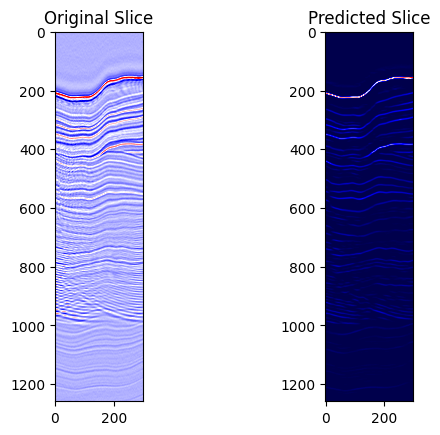

Epoch [98/200], Train Loss: 5061.2128, Train SSIM: 0.5594,           Val Loss: 5489.2151, Val SSIM: 0.5323


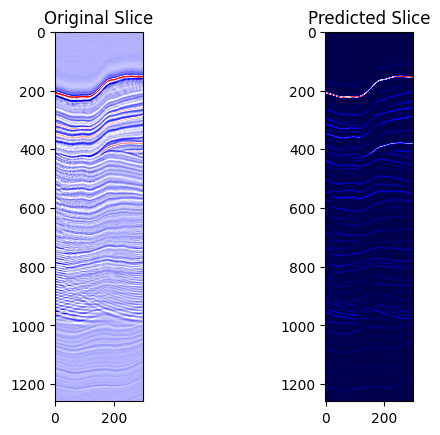

Epoch [99/200], Train Loss: 5071.7582, Train SSIM: 0.5582,           Val Loss: 5509.2957, Val SSIM: 0.5297


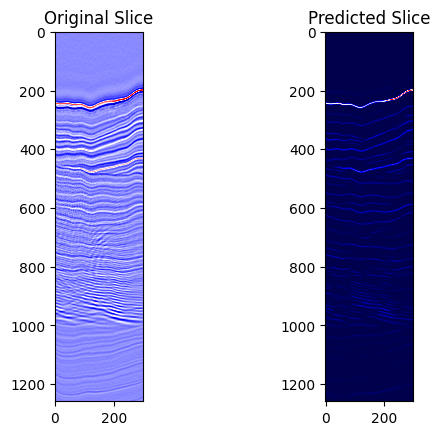

Epoch [100/200], Train Loss: 5078.1773, Train SSIM: 0.5589,           Val Loss: 5507.9557, Val SSIM: 0.5285


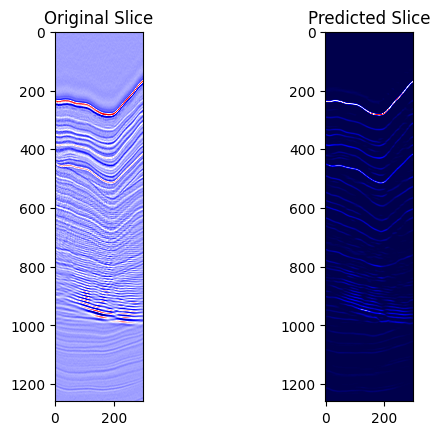

Epoch [101/200], Train Loss: 5050.9094, Train SSIM: 0.5585,           Val Loss: 5587.1634, Val SSIM: 0.5274


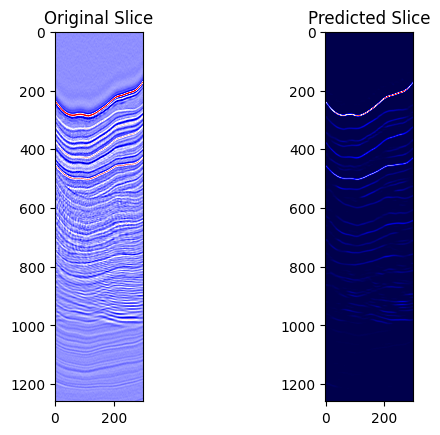

Epoch [102/200], Train Loss: 5068.2778, Train SSIM: 0.5569,           Val Loss: 5600.2099, Val SSIM: 0.5142


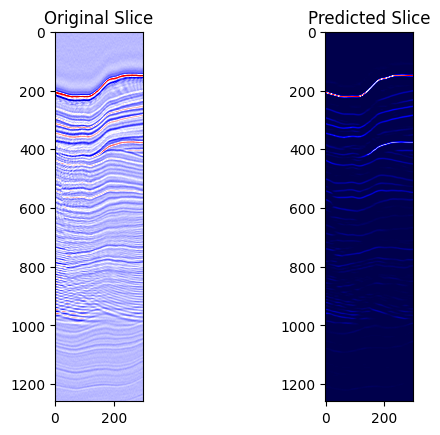

Epoch [103/200], Train Loss: 5049.9046, Train SSIM: 0.5593,           Val Loss: 5590.2176, Val SSIM: 0.5170


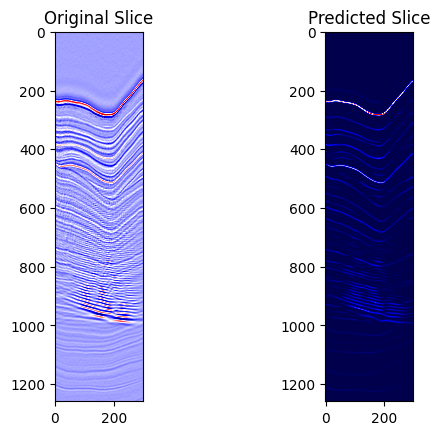

Epoch [104/200], Train Loss: 5072.5515, Train SSIM: 0.5587,           Val Loss: 5537.4879, Val SSIM: 0.5268


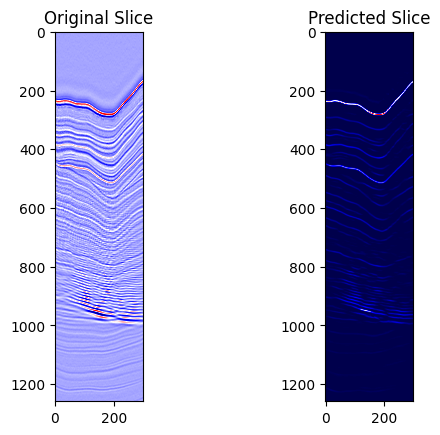

Epoch [105/200], Train Loss: 5018.6906, Train SSIM: 0.5591,           Val Loss: 5567.2723, Val SSIM: 0.5233


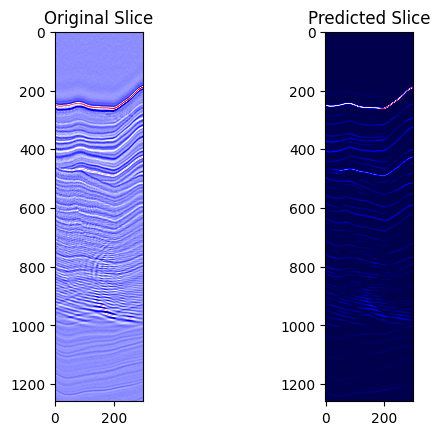

Epoch [106/200], Train Loss: 5043.1952, Train SSIM: 0.5585,           Val Loss: 5509.1274, Val SSIM: 0.5304


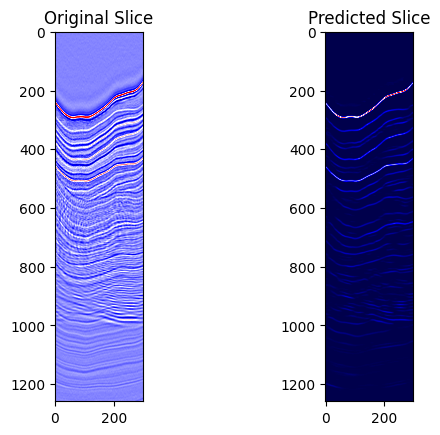

Epoch [107/200], Train Loss: 5043.2814, Train SSIM: 0.5593,           Val Loss: 5530.1130, Val SSIM: 0.5293


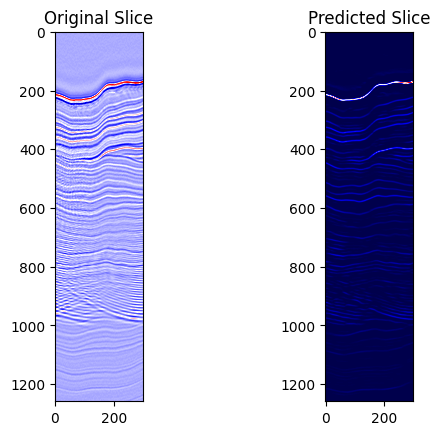

Epoch [108/200], Train Loss: 5056.2772, Train SSIM: 0.5584,           Val Loss: 5507.0289, Val SSIM: 0.5283


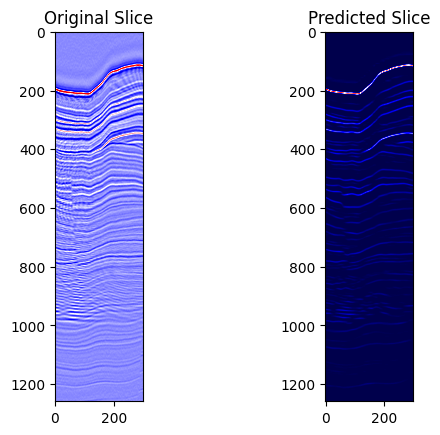

Epoch [109/200], Train Loss: 5075.8281, Train SSIM: 0.5575,           Val Loss: 5544.9603, Val SSIM: 0.5280


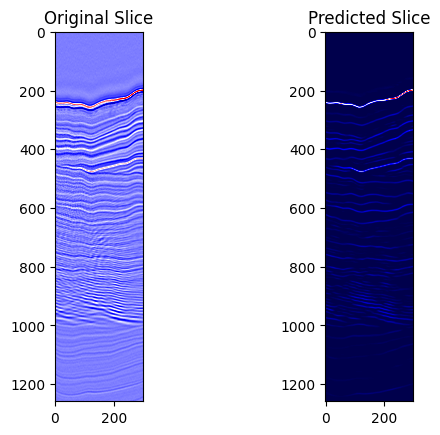

Epoch [110/200], Train Loss: 5039.2190, Train SSIM: 0.5586,           Val Loss: 5577.4748, Val SSIM: 0.5268


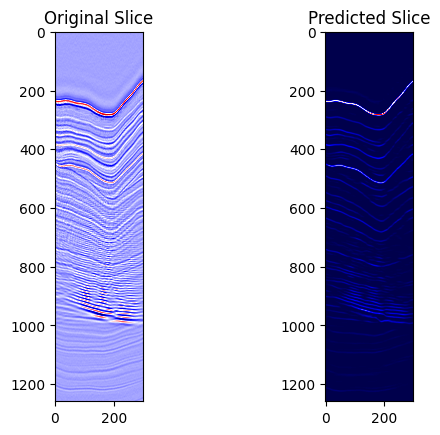

Epoch [111/200], Train Loss: 5023.6076, Train SSIM: 0.5598,           Val Loss: 5516.6304, Val SSIM: 0.5288


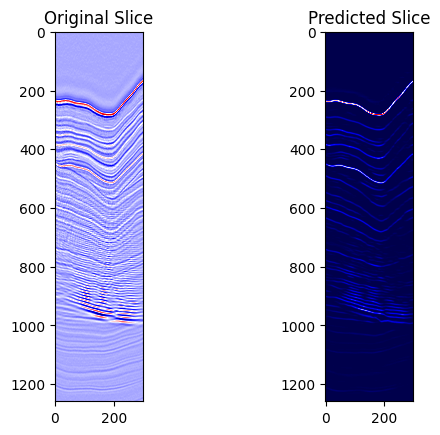

Epoch [112/200], Train Loss: 5036.2046, Train SSIM: 0.5605,           Val Loss: 5484.0725, Val SSIM: 0.5323


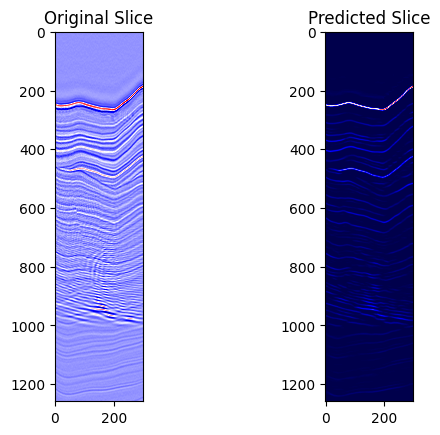

Epoch [113/200], Train Loss: 5059.3111, Train SSIM: 0.5594,           Val Loss: 5539.4427, Val SSIM: 0.5266


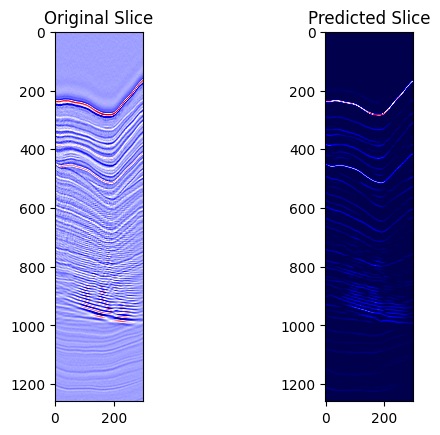

Epoch [114/200], Train Loss: 5035.6891, Train SSIM: 0.5592,           Val Loss: 5519.1229, Val SSIM: 0.5297


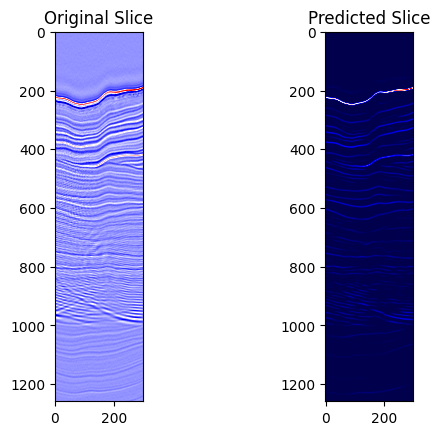

Epoch [115/200], Train Loss: 5042.2898, Train SSIM: 0.5597,           Val Loss: 5494.9851, Val SSIM: 0.5311


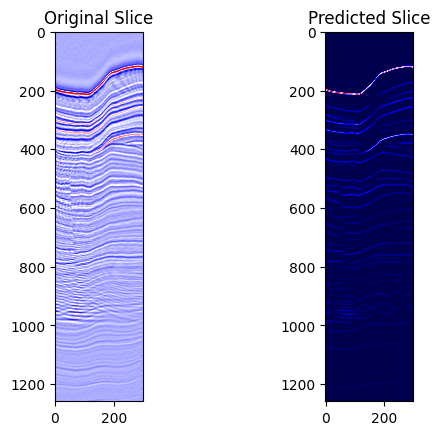

Epoch [116/200], Train Loss: 5019.5287, Train SSIM: 0.5612,           Val Loss: 5503.2750, Val SSIM: 0.5258


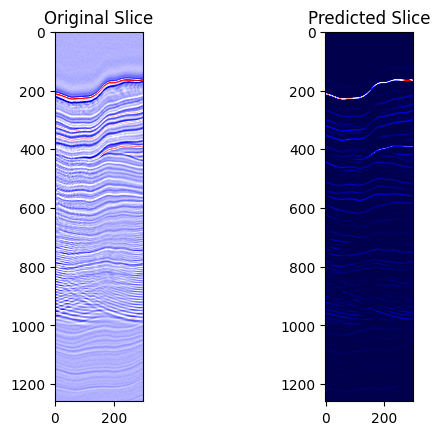

Epoch [117/200], Train Loss: 5019.7152, Train SSIM: 0.5598,           Val Loss: 5544.0504, Val SSIM: 0.5304


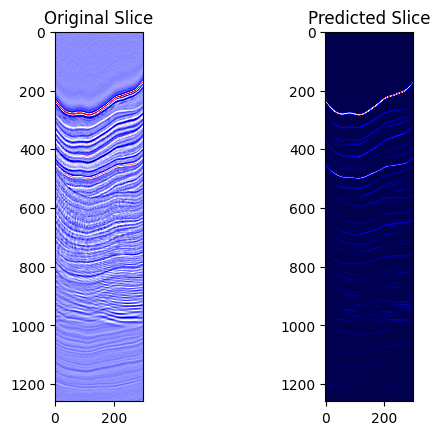

Epoch [118/200], Train Loss: 5040.0661, Train SSIM: 0.5594,           Val Loss: 5512.6543, Val SSIM: 0.5294


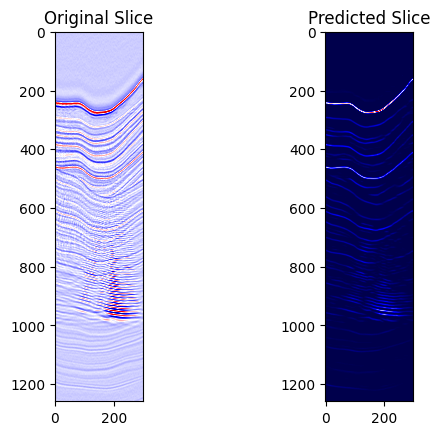

Epoch [119/200], Train Loss: 5034.9811, Train SSIM: 0.5606,           Val Loss: 5534.7944, Val SSIM: 0.5303


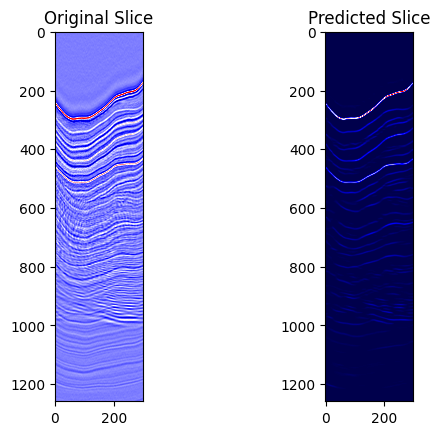

Epoch [120/200], Train Loss: 5034.6486, Train SSIM: 0.5612,           Val Loss: 5596.0081, Val SSIM: 0.5216


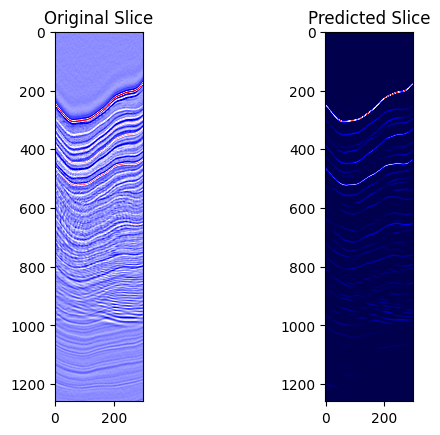

Epoch [121/200], Train Loss: 5020.9129, Train SSIM: 0.5599,           Val Loss: 5528.2838, Val SSIM: 0.5258


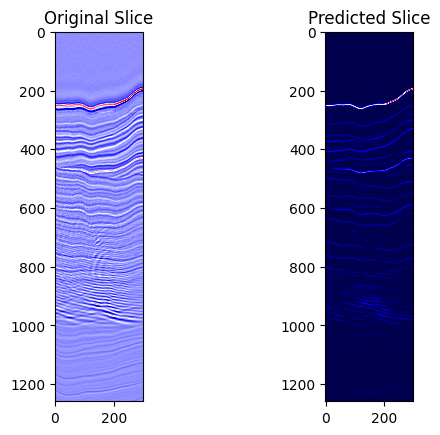

Epoch [122/200], Train Loss: 5027.6816, Train SSIM: 0.5614,           Val Loss: 5564.5706, Val SSIM: 0.5233


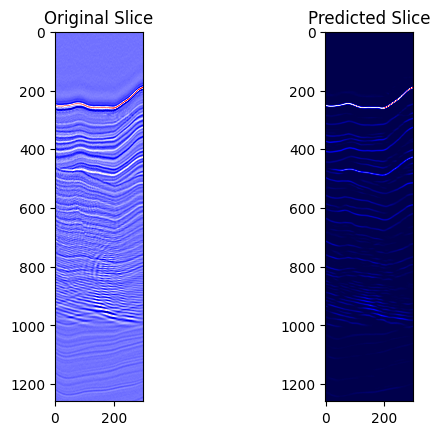

Epoch [123/200], Train Loss: 5027.9312, Train SSIM: 0.5613,           Val Loss: 5506.4671, Val SSIM: 0.5262


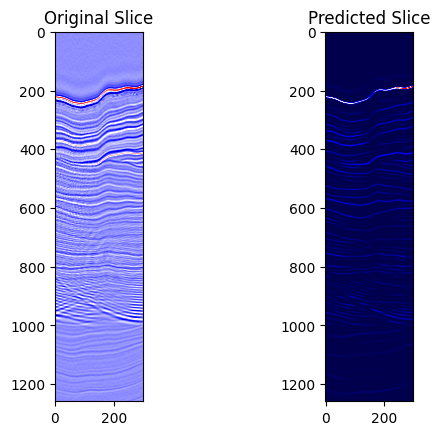

Epoch [124/200], Train Loss: 5005.7884, Train SSIM: 0.5596,           Val Loss: 5460.7474, Val SSIM: 0.5345


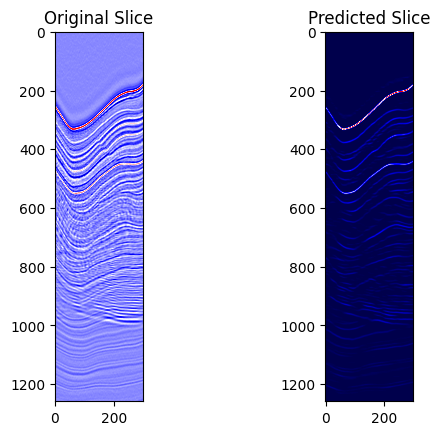

Epoch [125/200], Train Loss: 5012.9864, Train SSIM: 0.5609,           Val Loss: 5514.2420, Val SSIM: 0.5321


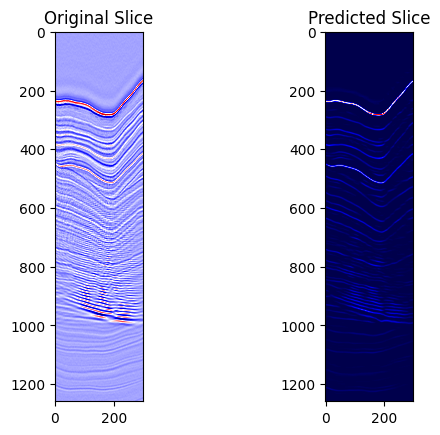

Epoch [126/200], Train Loss: 4993.2375, Train SSIM: 0.5621,           Val Loss: 5457.8717, Val SSIM: 0.5345


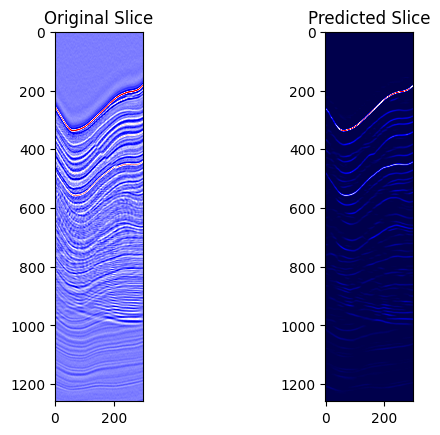

Epoch [127/200], Train Loss: 4998.5837, Train SSIM: 0.5623,           Val Loss: 5468.4627, Val SSIM: 0.5298


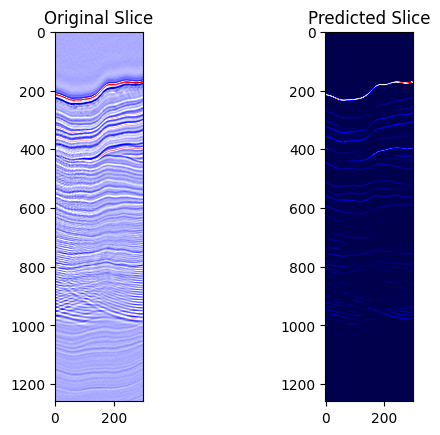

Epoch [128/200], Train Loss: 5032.6461, Train SSIM: 0.5615,           Val Loss: 5559.3615, Val SSIM: 0.5161


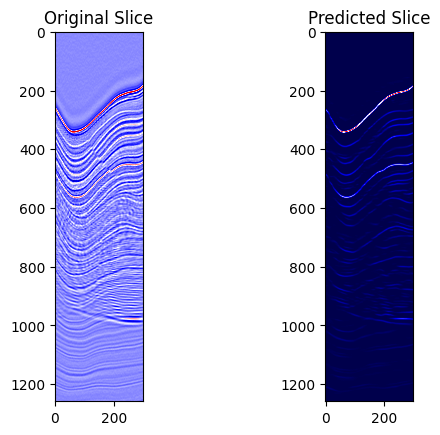

Epoch [129/200], Train Loss: 5042.4918, Train SSIM: 0.5597,           Val Loss: 5546.3288, Val SSIM: 0.5275


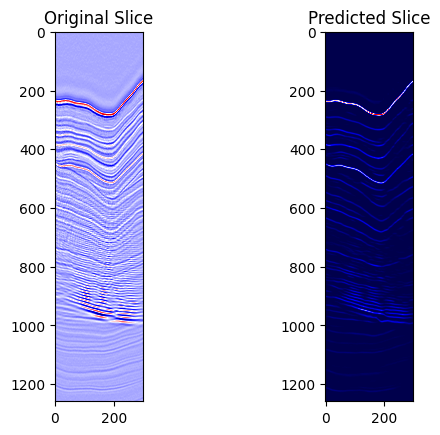

Epoch [130/200], Train Loss: 5009.7525, Train SSIM: 0.5623,           Val Loss: 5492.8511, Val SSIM: 0.5306


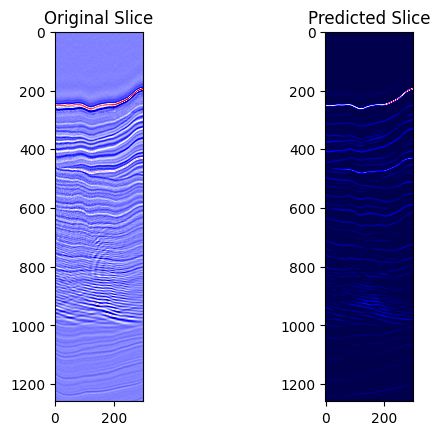

Epoch [131/200], Train Loss: 4996.2233, Train SSIM: 0.5611,           Val Loss: 5545.2957, Val SSIM: 0.5268


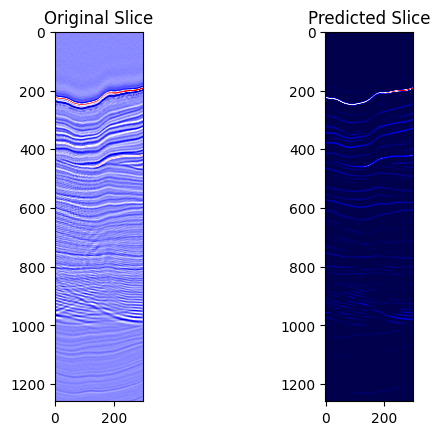

Epoch [132/200], Train Loss: 5020.6377, Train SSIM: 0.5610,           Val Loss: 5552.5415, Val SSIM: 0.5249


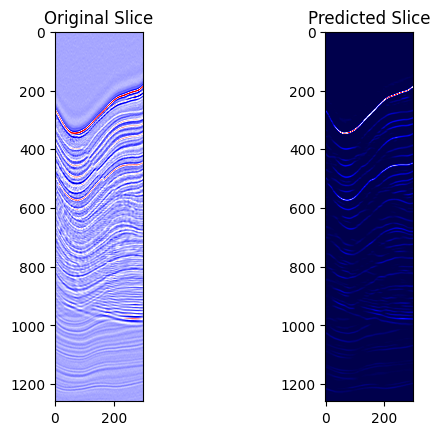

Epoch [133/200], Train Loss: 5017.6315, Train SSIM: 0.5596,           Val Loss: 5530.5121, Val SSIM: 0.5301


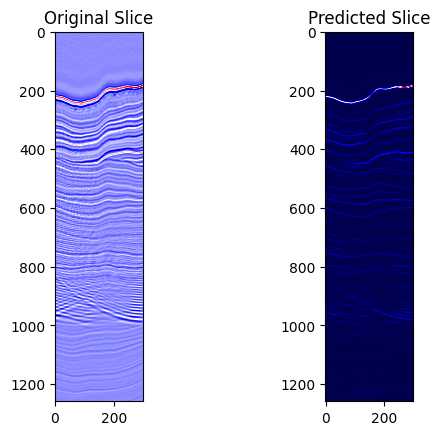

Epoch [134/200], Train Loss: 4985.2828, Train SSIM: 0.5617,           Val Loss: 5489.9892, Val SSIM: 0.5310


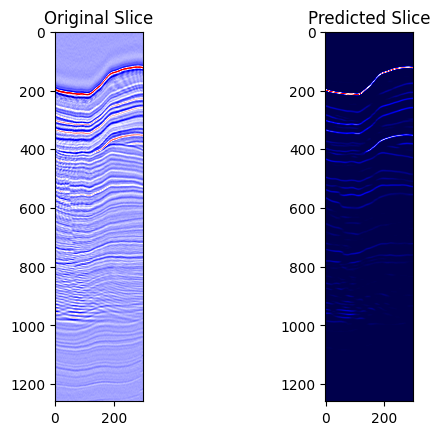

Epoch [135/200], Train Loss: 5021.7733, Train SSIM: 0.5615,           Val Loss: 5573.9493, Val SSIM: 0.5119


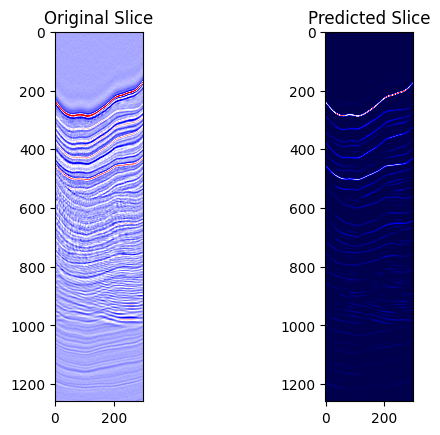

Epoch [136/200], Train Loss: 5013.2201, Train SSIM: 0.5613,           Val Loss: 5500.9091, Val SSIM: 0.5344


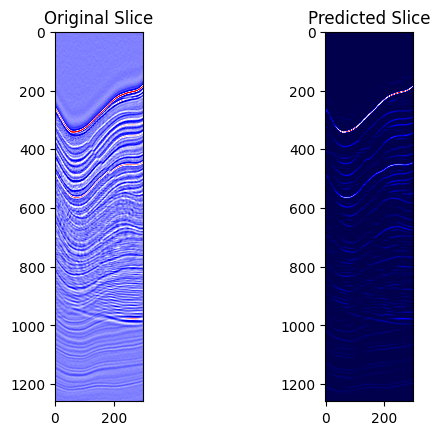

Epoch [137/200], Train Loss: 4994.8910, Train SSIM: 0.5614,           Val Loss: 5511.4194, Val SSIM: 0.5311


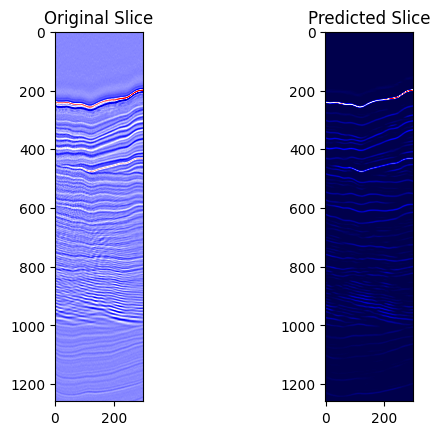

Epoch [138/200], Train Loss: 5016.2701, Train SSIM: 0.5612,           Val Loss: 5541.4604, Val SSIM: 0.5295


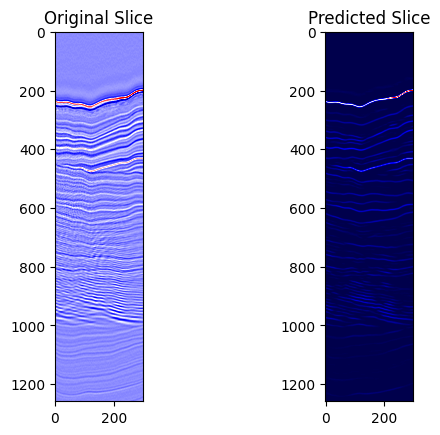

Epoch [139/200], Train Loss: 4985.1282, Train SSIM: 0.5617,           Val Loss: 5527.2600, Val SSIM: 0.5305


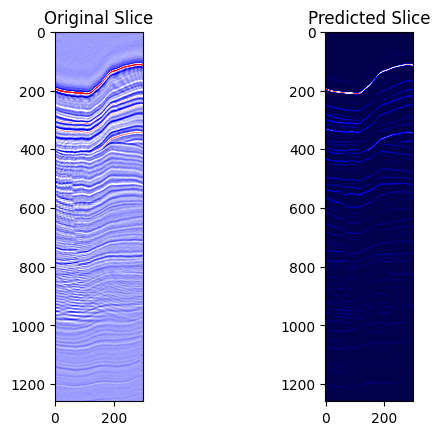

Epoch [140/200], Train Loss: 4987.1516, Train SSIM: 0.5617,           Val Loss: 5462.3339, Val SSIM: 0.5344


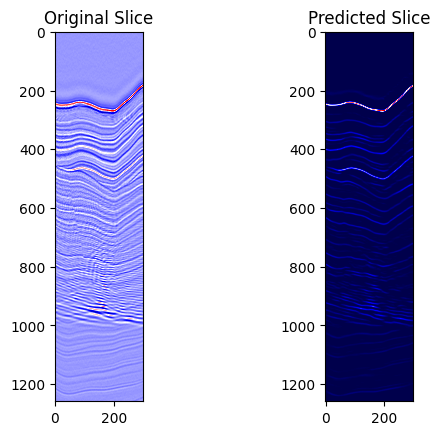

Epoch [141/200], Train Loss: 4998.6865, Train SSIM: 0.5607,           Val Loss: 5476.6680, Val SSIM: 0.5320


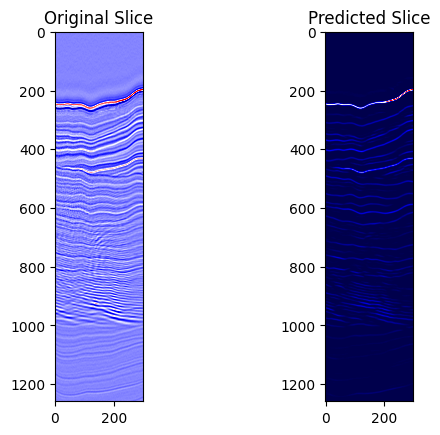

Epoch [142/200], Train Loss: 4996.8743, Train SSIM: 0.5614,           Val Loss: 5498.0663, Val SSIM: 0.5302


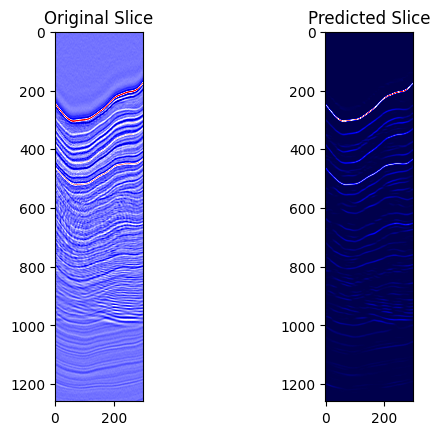

Epoch [143/200], Train Loss: 4998.2024, Train SSIM: 0.5628,           Val Loss: 5543.7153, Val SSIM: 0.5300


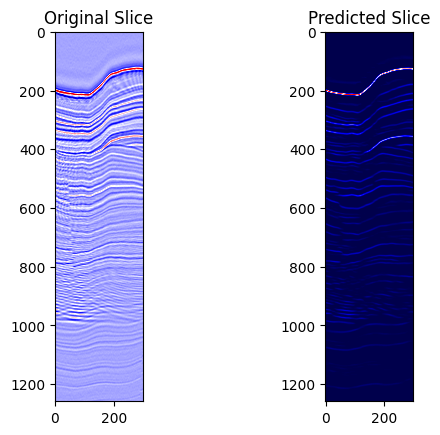

Epoch [144/200], Train Loss: 5007.7648, Train SSIM: 0.5605,           Val Loss: 5501.8539, Val SSIM: 0.5314


In [ ]:
# Number of epochs
num_epochs = 200

# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_ssim = 0.0

    for x_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(x_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        batch_ssim = ssim_metric(outputs.detach(), y_batch.detach())
        running_ssim += batch_ssim.item()

    # Validation phase
    model.eval()
    val_loss = 0.0
    val_ssim = 0.0
    with torch.no_grad():
        for x_val, y_val in val_loader:
            val_outputs = model(x_val)
            val_loss += criterion(val_outputs, y_val).item()
            val_ssim += ssim_metric(val_outputs, y_val).item()

    # Prediction on a single slice from X_slices_t
    random_slice = X_slices_t[torch.randint(0, len(X_slices_t), (1,)).item()]

    # Convert to PyTorch tensor and add batch and channel dimensions
    random_slice = torch.tensor(random_slice, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

    prediction = model(random_slice).detach()

    # Visualize the original and predicted slice
    plt.subplot(1, 2, 1)
    plt.title("Original Slice")
    plt.imshow(random_slice.squeeze().cpu().numpy(), cmap='seismic')

    plt.subplot(1, 2, 2)
    plt.title("Predicted Slice")
    plt.imshow(prediction.squeeze().cpu().numpy(), cmap='seismic')
    plt.show()

    print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {running_loss / len(train_loader):.4f}, Train SSIM: {running_ssim / len(train_loader):.4f}, \
          Val Loss: {val_loss / len(val_loader):.4f}, Val SSIM: {val_ssim / len(val_loader):.4f}")


print("Training complete!")
